In [1]:
import torch
import numpy as np
from scipy.stats import spearmanr

In [2]:
def cor(score1, score2):
    score1 = score1.detach().cpu()
    score2 = score2.detach().cpu()

    # Calculate correlations
    res = 0
    counter = 0
    for i in range(score1.shape[1]):
        tmp = spearmanr(
            np.array([score1[k][i] for k in range(len(score1))]),
            np.array([score2[k][i] for k in range(len(score2))])
        ).statistic
        if not np.isnan(tmp):
            res += tmp
            counter += 1

    return res/counter if counter > 0 else 0

In [ ]:
# Generate a batch of random sequential data that
train_input = torch.randn(4000, 500, 64)
train_grad_pre_activation = torch.randn(4000, 500, 64)

test_input = torch.randn(500, 500, 64)
test_grad_pre_activation = torch.randn(500, 500, 64)
# test_input = train_input
# test_grad_pre_activation = train_grad_pre_activation

train_grad = torch.einsum('ijk,ijl->ikl', train_grad_pre_activation, train_input).reshape(train_input.shape[0], -1)
test_grad = torch.einsum('ijk,ijl->ikl', test_grad_pre_activation, test_input).reshape(test_input.shape[0], -1)

# train_grad = torch.load('train_gradients.pt')
# test_grad = torch.load('test_gradients.pt')

print("train_grad shape:", train_grad.shape)
print("test_grad shape:", test_grad.shape)

precondition = False

if precondition:
    train_grad_cov = torch.matmul(train_grad.T, train_grad) / train_grad.shape[0]
    train_grad_cov_inv = torch.linalg.inv(train_grad_cov)

    train_grad_preconditioned = torch.matmul(train_grad, train_grad_cov_inv)
    score = torch.matmul(train_grad_preconditioned, test_grad.T)
else:
    score = torch.matmul(train_grad, test_grad.T)

train_grad shape: torch.Size([4000, 4096])
test_grad shape: torch.Size([500, 4096])


In [13]:
print(score)

tensor([[ 31693.6758,  28734.0898,  10404.1221,  ...,  38852.0547,
          70616.7422, -23488.3359],
        [ 60319.2500, -42509.5664,   5245.9951,  ...,  23292.0312,
          13844.9844,  46950.7344],
        [ 11139.9736,  20275.6660, -28507.4297,  ...,  26777.2070,
          18701.5918, -17314.9590],
        ...,
        [ 37222.7656,  20556.5605,  13031.4336,  ...,  16657.7070,
         -25796.6055, -75305.2109],
        [  8937.2812,  33326.5234,   6097.6333,  ...,  14075.9551,
           8607.6914,   3240.1533],
        [ 13468.4473,  -1204.0522,  14196.9512,  ..., -34235.3555,
          33210.5859,   4209.7378]])


# Features Distribution

In [ ]:
# Plot the feature distribution from the synthetic data
import matplotlib.pyplot as plt
import seaborn as sns


# Random Drop (Gradient)

In [6]:
random_drop = 0.1
precondition = True
grad_randrp_indices = torch.rand(train_grad[0].shape) < random_drop
train_grad_randrp = train_grad[:, grad_randrp_indices]
test_grad_randrp = test_grad[:, grad_randrp_indices]
if precondition:
    train_grad_cov = torch.matmul(train_grad_randrp.T, train_grad_randrp) / train_grad_randrp.shape[0]
    train_grad_cov_inv = torch.linalg.inv(train_grad_cov)

    train_grad_preconditioned = torch.matmul(train_grad_randrp, train_grad_cov_inv)
    score_randrp = torch.matmul(train_grad_preconditioned, test_grad_randrp.T)
else:
    score_randrp = torch.matmul(train_grad, test_grad_randrp.T)

print(cor(score_randrp, score))

0.005175887291899981


In [ ]:
# random drop the gradient
random_drop = 0.1

precondition = True

# Get the first layer gradients
for layer in range(train_grad.shape[0]):
    train_grad_layer = train_grad[layer]
    test_grad_layer = test_grad[layer]

    if precondition:
        train_grad_cov = torch.matmul(train_grad_layer.T, train_grad_layer) / train_grad_layer.shape[0]
        train_grad_cov_inv = torch.linalg.inv(train_grad_cov)

        train_grad_preconditioned = torch.matmul(train_grad_layer, train_grad_cov_inv)
        score = torch.matmul(train_grad_preconditioned, test_grad_layer.T)
    else:
        score = torch.matmul(train_grad_layer, test_grad_layer.T)

    grad_randrp_indices = torch.rand(train_grad_layer[0].shape) < random_drop
    train_grad_randrp = train_grad_layer[:, grad_randrp_indices]
    test_grad_randrp = test_grad_layer[:, grad_randrp_indices]

    if precondition:
        # Compute empirical covariance of the training data
        train_grad_cov_randrp = torch.matmul(train_grad_randrp.T, train_grad_randrp) / train_grad_randrp.shape[0]
        train_grad_cov_randrp_inv = torch.linalg.inv(train_grad_cov_randrp)

        # Precondition the training data
        train_grad_randrp_preconditioned = torch.matmul(train_grad_randrp, train_grad_cov_randrp_inv)

        # Compute the inner products between the preconditioned training grad and the original test grad
        score_randrp = torch.matmul(train_grad_randrp_preconditioned, test_grad_randrp.T)
    else:
        # Compute the inner products between the original training grad and the original test grad
        score_randrp = torch.matmul(train_grad_randrp, test_grad_randrp.T)

    print(f"Correlation between scores for layer {layer}:", cor(score_randrp, score))

Correlation between scores for layer 0: 0.112945490658739
Correlation between scores for layer 1: 0.10228219881510099
Correlation between scores for layer 2: 0.11080479242229697
Correlation between scores for layer 3: 0.10753619298770227
Correlation between scores for layer 4: 0.11130116372190248
Correlation between scores for layer 5: 0.10451620789439647


KeyboardInterrupt: 

In [ ]:
print("Correlation between scores:", cor(score_randrp, score))

Correlation between scores: 0.1095669722553934


# Threshold (Activation)

In [ ]:
# # threshold the input and grad_pre_activation
# threshold = 1e-4

# train_input_thrd = torch.where(torch.abs(train_input) > threshold, train_input, torch.zeros_like(train_input))
# train_grad_pre_activation_thrd = torch.where(torch.abs(train_grad_pre_activation) > threshold, train_grad_pre_activation, torch.zeros_like(train_grad_pre_activation))

# test_input_thrd = torch.where(torch.abs(test_input) > threshold, test_input, torch.zeros_like(test_input))
# test_grad_pre_activation_thrd = torch.where(torch.abs(test_grad_pre_activation) > threshold, test_grad_pre_activation, torch.zeros_like(test_grad_pre_activation))

# train_grad_from_thrd = torch.einsum('ijk,ijl->ikl', train_grad_pre_activation_thrd, train_input_thrd).reshape(train_input.shape[0], -1)
# test_grad_from_thrd = torch.einsum('ijk,ijl->ikl', test_grad_pre_activation_thrd, test_input_thrd).reshape(test_input.shape[0], -1)

# if precondition:
#     # Compute empirical covariance of the training data
#     train_grad_cov_from_thrd = torch.matmul(train_grad_from_thrd.T, train_grad_from_thrd) / train_grad_from_thrd.shape[0]
#     train_grad_cov_from_thrd_inv = torch.linalg.inv(train_grad_cov_from_thrd)

#     # Precondition the training data
#     train_grad_from_thrd_preconditioned = torch.matmul(train_grad_from_thrd, train_grad_cov_from_thrd_inv)

#     # Compute the inner products between the preconditioned training grad and the original test grad
#     score_from_thrd = torch.matmul(train_grad_from_thrd_preconditioned, test_grad_from_thrd.T)
# else:
#     # Compute the inner products between the original training grad and the original test grad
#     score_from_thrd = torch.matmul(train_grad_from_thrd, test_grad_from_thrd.T)

In [ ]:
# print("Correlation between scores:", cor(score_from_thrd, score))

# # inspect sparsity
# print("Sparsity of the input for thresholding in activation-level:", torch.sum(train_input_thrd == 0) / train_input_thrd.numel())
# print("Sparsity of the training grad for thresholding in activation-level:", torch.sum(train_grad_from_thrd == 0) / train_grad_from_thrd.numel())

In [ ]:
# if precondition:
#     train_grad_cov_cond = torch.linalg.cond(train_grad_cov)
#     train_grad_cov_from_thrd_cond = torch.linalg.cond(train_grad_cov_from_thrd)
#     print("Condition number of covariance matrix")
#     print("\tOriginal: ", train_grad_cov_cond)
#     print("\tThreshold on activation-level: ", train_grad_cov_from_thrd_cond)

#     train_grad_cov_eigenvalues = torch.linalg.eigvals(train_grad_cov)
#     train_grad_cov_from_thrd_eigenvalues = torch.linalg.eigvals(train_grad_cov_from_thrd)
#     print("Eigenvalues of covariance matrix")
#     print("\tOriginal: ", train_grad_cov_eigenvalues)
#     print("\tThreshold on gradient-level: ", train_grad_cov_from_thrd_eigenvalues)

#     train_grad_cov_inv_cond = torch.linalg.cond(train_grad_cov_inv)
#     train_grad_cov_from_thrd_inv_cond = torch.linalg.cond(train_grad_cov_from_thrd_inv)
#     print("Condition number of covariance matrix inverse")
#     print("\tOriginal: ", train_grad_cov_inv_cond)
#     print("\tThreshold on activation-level: ", train_grad_cov_from_thrd_inv_cond)

#     train_grad_cov_inv_eigenvalues = torch.linalg.eigvals(train_grad_cov_inv)
#     train_grad_cov_from_thrd_inv_eigenvalues = torch.linalg.eigvals(train_grad_cov_from_thrd_inv)
#     print("Eigenvalues of covariance matrix inverse")
#     print("\tOriginal: ", train_grad_cov_inv_eigenvalues)
#     print("\tThreshold on gradient-level: ", train_grad_cov_from_thrd_inv_eigenvalues)

#     # investigate the difference of two covariance matrices
#     diff = torch.linalg.norm(train_grad_cov - train_grad_cov_from_thrd)
#     print("Difference of covariance matrices: ", diff)

#     # investigate the difference of two covariance matrices' inverses
#     diff = torch.linalg.norm(train_grad_cov_inv - train_grad_cov_from_thrd_inv)
#     print("Difference of covariance matrices' inverses: ", diff)

# Threshold (Gradient)

In [ ]:
# # threshold the gradient
# threshold = 1e-4

# train_grad_thrd = torch.where(torch.abs(train_grad) > threshold, train_grad, torch.zeros_like(train_grad))
# test_grad_thrd = torch.where(torch.abs(test_grad) > threshold, test_grad, torch.zeros_like(test_grad))

# if precondition:
#     # Compute empirical covariance of the training data
#     train_grad_cov_thrd = torch.matmul(train_grad_thrd.T, train_grad_thrd) / train_grad_thrd.shape[0]
#     train_grad_cov_thrd_inv = torch.linalg.inv(train_grad_cov_thrd)

#     # Precondition the training data
#     train_grad_thrd_preconditioned = torch.matmul(train_grad_thrd, train_grad_cov_thrd_inv)

#     # Compute the inner products between the preconditioned training grad and the original test grad
#     score_thrd = torch.matmul(train_grad_thrd_preconditioned, test_grad_thrd.T)
# else:
#     # Compute the inner products between the original training grad and the original test grad
#     score_thrd = torch.matmul(train_grad_thrd, test_grad_thrd.T)

In [ ]:
# print("Correlation between scores:", cor(score_thrd, score))

# # inspect sparsity
# print("Sparsity of the input for thresholding in activation-level:", torch.sum(train_input_thrd == 0) / train_input_thrd.numel())
# print("Sparsity of the training grad for thresholding in activation-level:", torch.sum(train_grad_thrd == 0) / train_grad_thrd.numel())

In [ ]:
# if precondition:
#     train_grad_cov_cond = torch.linalg.cond(train_grad_cov)
#     train_grad_cov_thrd_cond = torch.linalg.cond(train_grad_cov_thrd)
#     print("Condition number of covariance matrix")
#     print("\tOriginal: ", train_grad_cov_cond)
#     print("\tThreshold on gradient-level: ", train_grad_cov_thrd_cond)

#     train_grad_cov_eigenvalues = torch.linalg.eigvals(train_grad_cov)
#     train_grad_cov_thrd_eigenvalues = torch.linalg.eigvals(train_grad_cov_thrd)
#     print("Eigenvalues of covariance matrix")
#     print("\tOriginal: ", train_grad_cov_eigenvalues)
#     print("\tThreshold on gradient-level: ", train_grad_cov_thrd_eigenvalues)

#     train_grad_cov_inv_cond = torch.linalg.cond(train_grad_cov_inv)
#     train_grad_cov_thrd_inv_cond = torch.linalg.cond(train_grad_cov_thrd_inv)
#     print("Condition number of covariance matrix inverse")
#     print("\tOriginal: ", train_grad_cov_inv_cond)
#     print("\tThreshold on gradient-level: ", train_grad_cov_thrd_inv_cond)

#     train_grad_cov_inv_eigenvalues = torch.linalg.eigvals(train_grad_cov_inv)
#     train_grad_cov_thrd_inv_eigenvalues = torch.linalg.eigvals(train_grad_cov_thrd_inv)
#     print("Eigenvalues of covariance matrix inverse")
#     print("\tOriginal: ", train_grad_cov_inv_eigenvalues)
#     print("\tThreshold on gradient-level: ", train_grad_cov_thrd_inv_eigenvalues)

#     # investigate the difference of two covariance matrices
#     diff = torch.linalg.norm(train_grad_cov - train_grad_cov_thrd)
#     print("Difference of covariance matrices: ", diff)

#     # investigate the difference of two covariance matrices' inverses
#     diff = torch.linalg.norm(train_grad_cov_inv - train_grad_cov_thrd_inv)
#     print("Difference of covariance matrices' inverses: ", diff)

In [11]:
# Function to analyze gradient properties
def analyze_gradients(train_grad, test_grad, title_prefix=""):
    # Plot histograms of gradients
    plt.figure(figsize=(15, 10))

    train_sample = train_grad.flatten().numpy()
    test_sample = test_grad.flatten().numpy()

    print(train_sample)
    print(test_sample)

    # Plot train gradient histogram
    plt.subplot(2, 2, 1)
    plt.hist(train_sample, bins=50, alpha=0.7)
    plt.title(f'{title_prefix} Train Gradient Distribution')
    plt.xlabel('Gradient Value')
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)

    # Plot test gradient histogram
    plt.subplot(2, 2, 2)
    plt.hist(test_sample, bins=50, alpha=0.7)
    plt.title(f'{title_prefix} Test Gradient Distribution')
    plt.xlabel('Gradient Value')
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)

    # Calculate and plot the eigenvalue spectrum of the covariance matrix
    if train_grad.shape[0] > 1:
        # Compute covariance matrix and its eigenvalues
        train_grad_cov = torch.matmul(train_grad.T, train_grad) / train_grad.shape[0]
        eigenvalues = torch.linalg.eigvalsh(train_grad_cov).numpy()
        eigenvalues = np.sort(eigenvalues)[::-1]  # Sort in descending order

        # Plot eigenvalue spectrum
        plt.subplot(2, 2, 3)
        plt.semilogy(np.arange(1, len(eigenvalues) + 1), eigenvalues)
        plt.title(f'{title_prefix} Eigenvalue Spectrum of Train Gradient Covariance')
        plt.xlabel('Eigenvalue Index')
        plt.ylabel('Eigenvalue (log scale)')
        plt.grid(True, alpha=0.3)

        # Calculate condition number
        condition_number = eigenvalues[0] / max(eigenvalues[-1], 1e-10)

    # PCA on gradients to visualize major directions of variation
    if train_grad.shape[0] > 2:
        # Subsample for PCA to avoid memory issues
        train_subset = train_grad.numpy()
        test_subset = test_grad.numpy()

        # Apply PCA
        pca = PCA(n_components=2)
        train_pca = pca.fit_transform(train_subset)
        test_pca = pca.transform(test_subset)

        # Plot PCA projection
        plt.subplot(2, 2, 4)
        plt.scatter(train_pca[:, 0], train_pca[:, 1], alpha=0.5, label='Train')
        plt.scatter(test_pca[:, 0], test_pca[:, 1], alpha=0.5, label='Test')
        plt.title(f'{title_prefix} PCA Projection of Gradients')
        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Calculate explained variance
        explained_variance = pca.explained_variance_ratio_

    plt.tight_layout()
    plt.suptitle(f'{title_prefix} Gradient Analysis', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()

In [12]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns

# Load or generate the data
# For synthetic data
syn_train_input = torch.randn(4000, 500, 64)
syn_train_grad_pre_activation = torch.randn(4000, 500, 64)
syn_test_input = torch.randn(500, 500, 64)
syn_test_grad_pre_activation = torch.randn(500, 500, 64)

# Generate synthetic gradients
syn_train_grad = torch.einsum('ijk,ijl->ikl', syn_train_grad_pre_activation, syn_train_input).reshape(syn_train_input.shape[0], -1)
syn_test_grad = torch.einsum('ijk,ijl->ikl', syn_test_grad_pre_activation, syn_test_input).reshape(syn_test_input.shape[0], -1)

# For real data (assuming these files exist in the working directory)
# If running in an environment without these files, comment out these lines
real_train_grad = torch.load('train_gradients.pt')
real_test_grad = torch.load('test_gradients.pt')

print("Synthetic train_grad shape:", syn_train_grad.shape)
print("Synthetic test_grad shape:", syn_test_grad.shape)
print("Real train_grad shape:", real_train_grad.shape)
print("Real test_grad shape:", real_test_grad.shape)

Synthetic train_grad shape: torch.Size([4000, 4096])
Synthetic test_grad shape: torch.Size([500, 4096])
Real train_grad shape: torch.Size([49, 4656, 4096])
Real test_grad shape: torch.Size([49, 481, 4096])


torch.Size([4000, 4096])
torch.Size([500, 4096])
[  8.713581    5.527784   23.758749  ... -27.441807    5.4793806
   4.6003532]
[ -4.730855   14.594777    5.6775274 ... -11.505698   16.741587
 -27.165627 ]


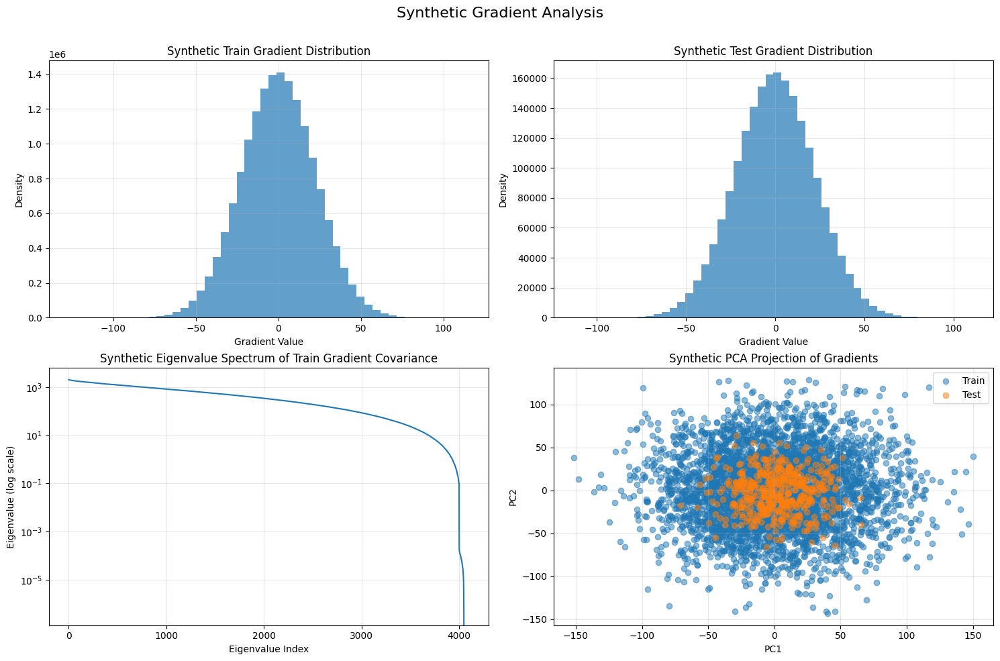

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 0...
[-2.1487012e-05 -6.1760047e-06 -1.4743088e-05 ...  8.5326974e-06
 -3.2186366e-05  3.3046030e-07]
[-1.0231788e-05 -8.0696715e-05  2.3495712e-05 ... -1.3539405e-04
 -3.3187534e-04 -5.1882613e-04]


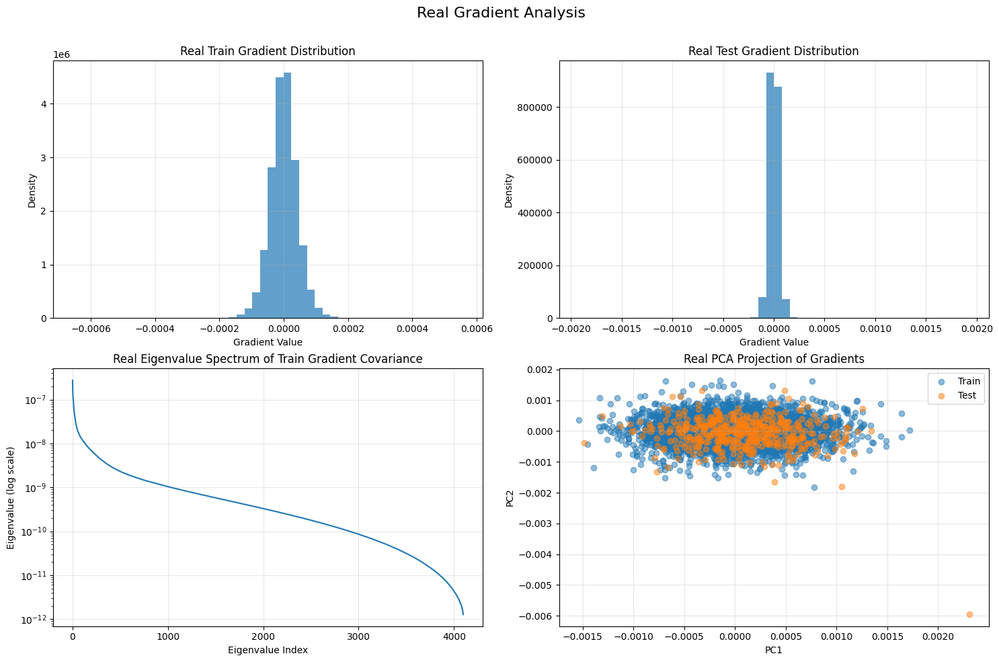

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 1...
[-2.3239139e-05 -4.2450003e-05  6.8097812e-05 ...  5.9185655e-05
  6.7919987e-05  3.5581543e-05]
[ 4.1941537e-05  4.4260993e-05  1.8918248e-05 ...  1.4229810e-04
 -1.2223036e-03 -3.2136065e-04]


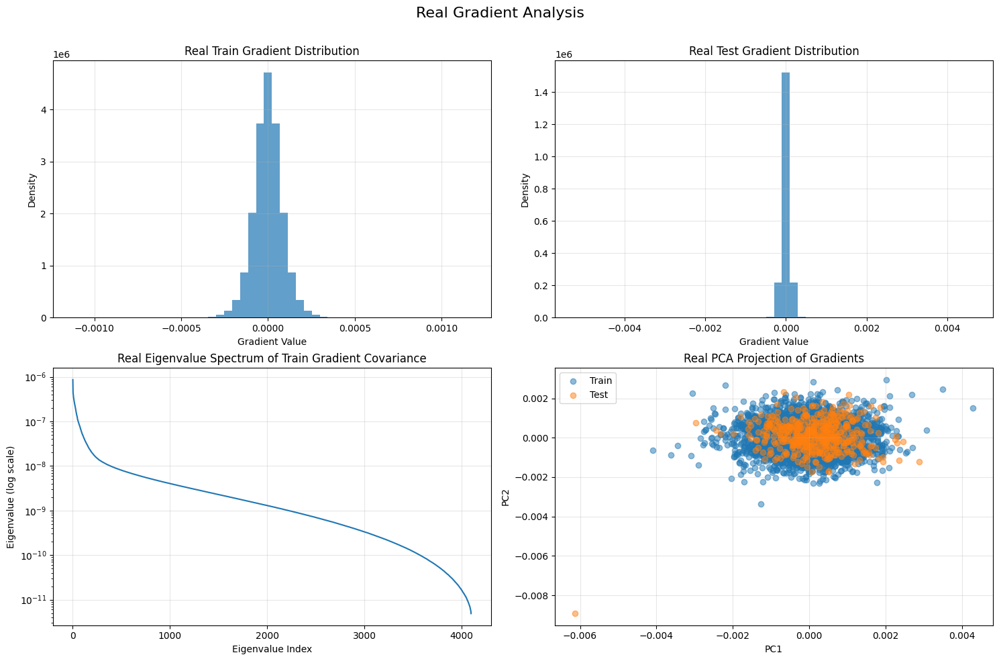

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 2...
[-2.5134516e-06  1.6535507e-05 -4.2681982e-05 ... -2.5427478e-05
  6.3663556e-06 -2.7713511e-05]
[ 3.2348782e-06  2.1732124e-06  5.5172804e-06 ...  1.7851286e-05
 -3.2194312e-05  5.2513496e-05]


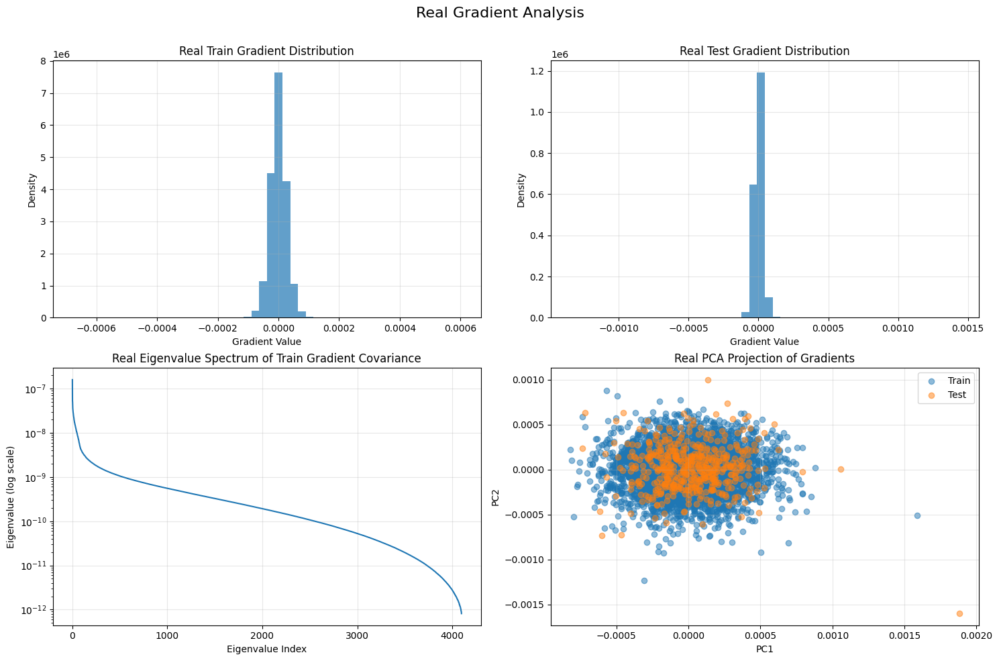

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 3...
[ 5.0158189e-05  5.8021214e-06  1.2689580e-07 ...  3.4499863e-05
 -1.1299548e-05  4.2972832e-07]
[-1.0372176e-05  7.9507918e-06 -9.4400530e-06 ... -1.1882783e-04
  1.8805180e-04 -4.5865600e-05]


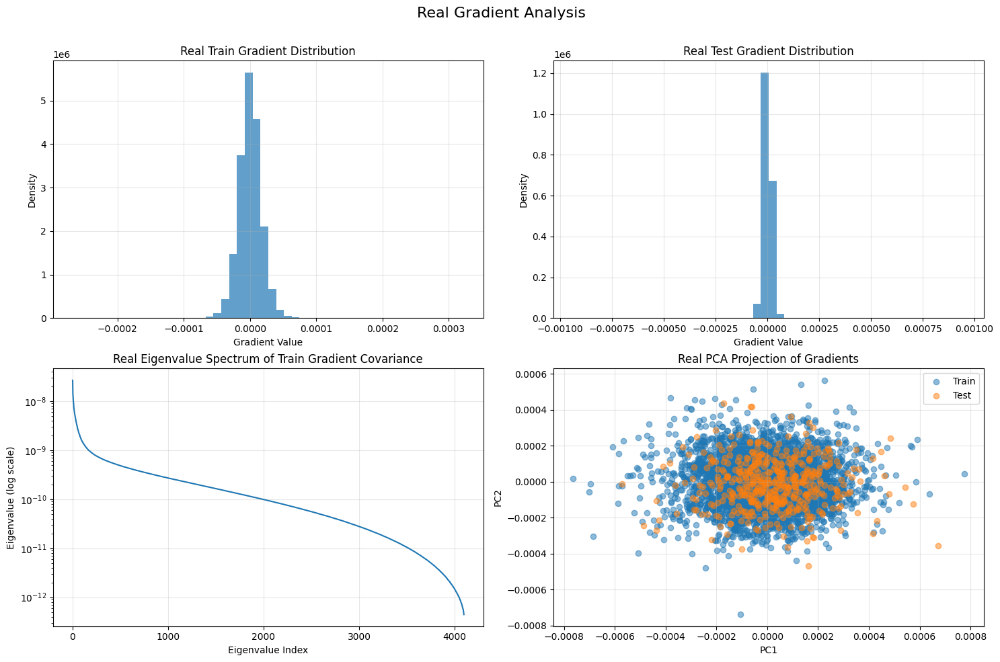

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 4...
[-2.2879962e-05  1.7298726e-05  3.4439516e-05 ... -9.6220465e-06
 -2.3899070e-06 -1.5528483e-05]
[-4.9436028e-05  2.5206893e-05  6.4702959e-05 ... -4.8391861e-04
  4.8499153e-04 -5.2382360e-04]


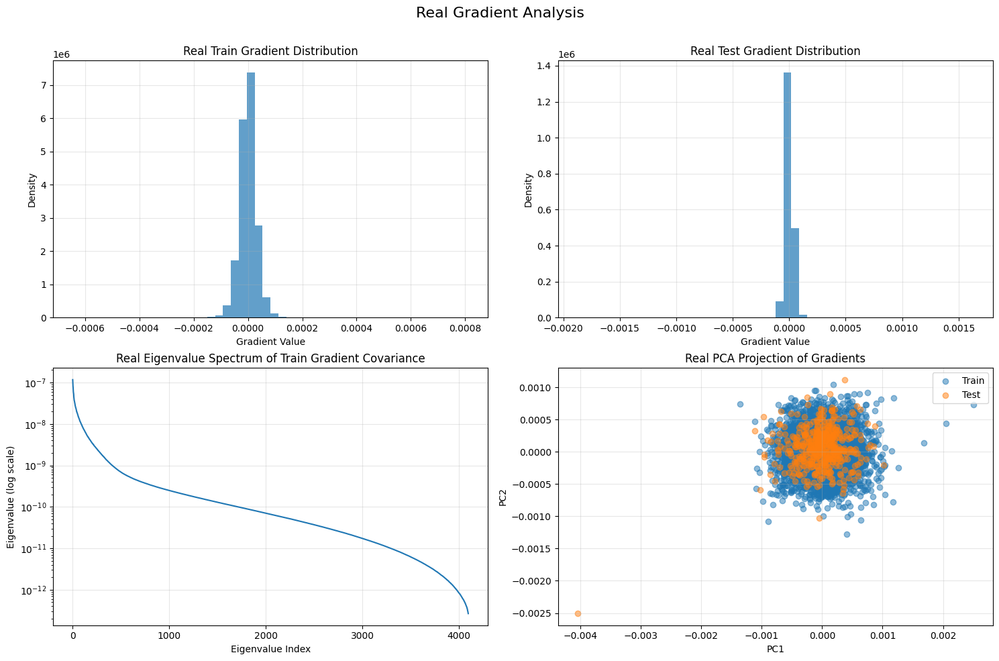

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 5...
[ 4.9022652e-05 -3.5936118e-05  3.6696096e-05 ... -4.8046072e-06
 -1.5465966e-05  4.6916222e-05]
[-2.8385990e-05  1.1065434e-06 -3.0087882e-05 ... -1.9908060e-04
  7.1637936e-05  5.3157913e-04]


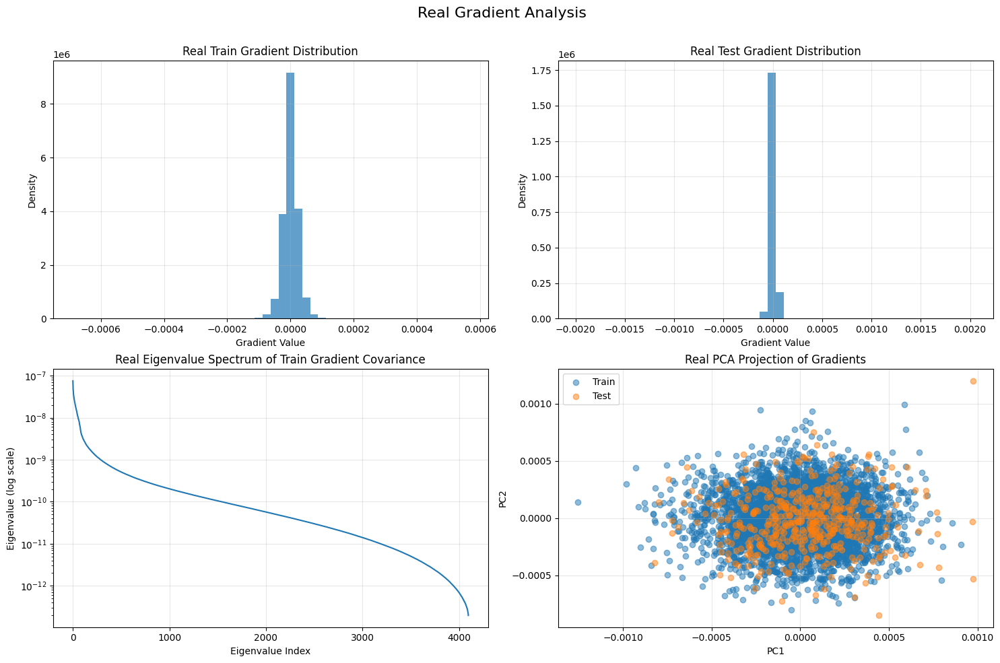

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 6...
[ 7.0446957e-05 -9.2833012e-05  1.3809229e-06 ...  6.9620255e-06
 -1.9599687e-05 -2.0593548e-05]
[ 3.5432684e-05 -7.8895346e-06  4.6401554e-05 ...  4.8426791e-05
 -4.4303454e-04 -1.4249602e-03]


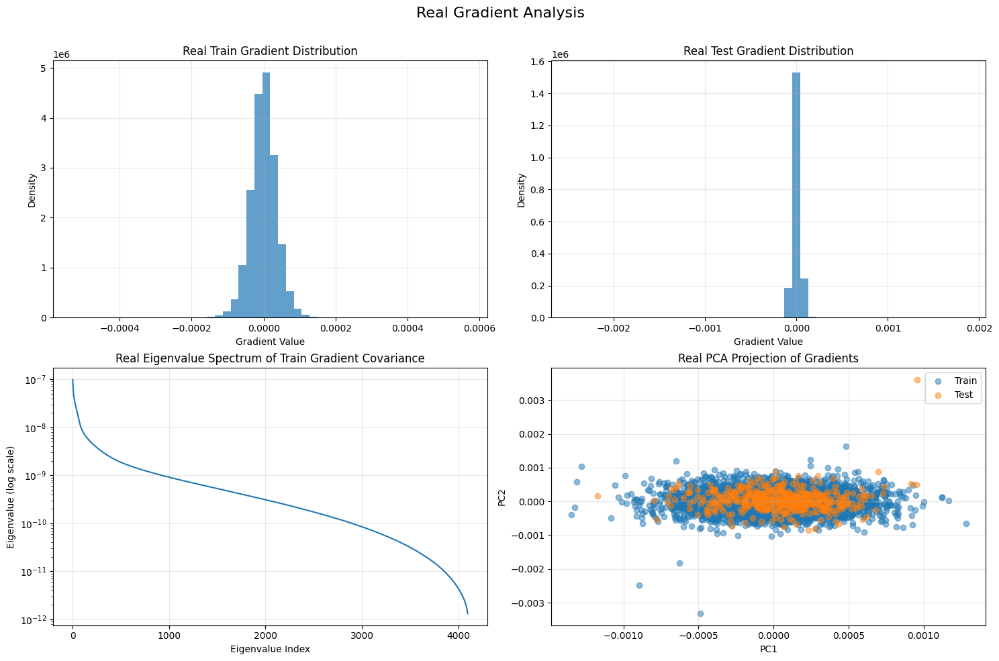

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 7...
[-1.1120228e-06 -1.9397829e-05  2.1659565e-05 ... -1.2503977e-05
 -2.4412502e-05 -4.9198529e-06]
[ 1.5432037e-05 -2.5868978e-05  6.6005578e-06 ...  6.2620809e-04
  6.5348911e-05 -3.8197418e-04]


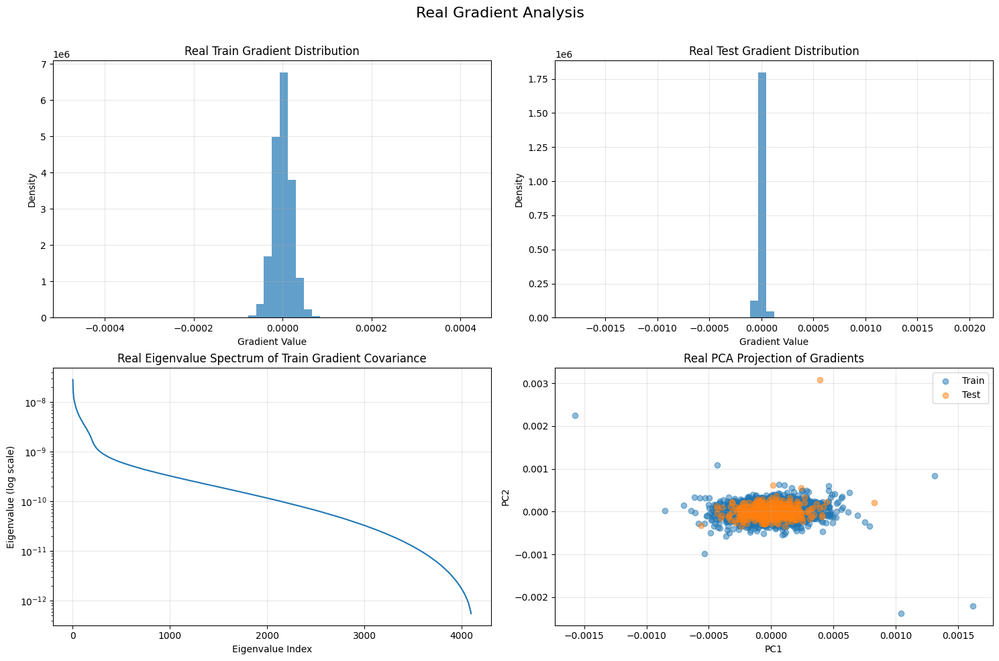

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 8...
[-2.1250433e-05 -1.7435972e-05  1.6916865e-05 ...  2.5309848e-05
 -7.1872669e-06 -2.6996015e-05]
[-2.6662688e-05  2.0972802e-05  2.4769099e-05 ... -3.5470707e-04
 -1.2806419e-03  7.5385207e-04]


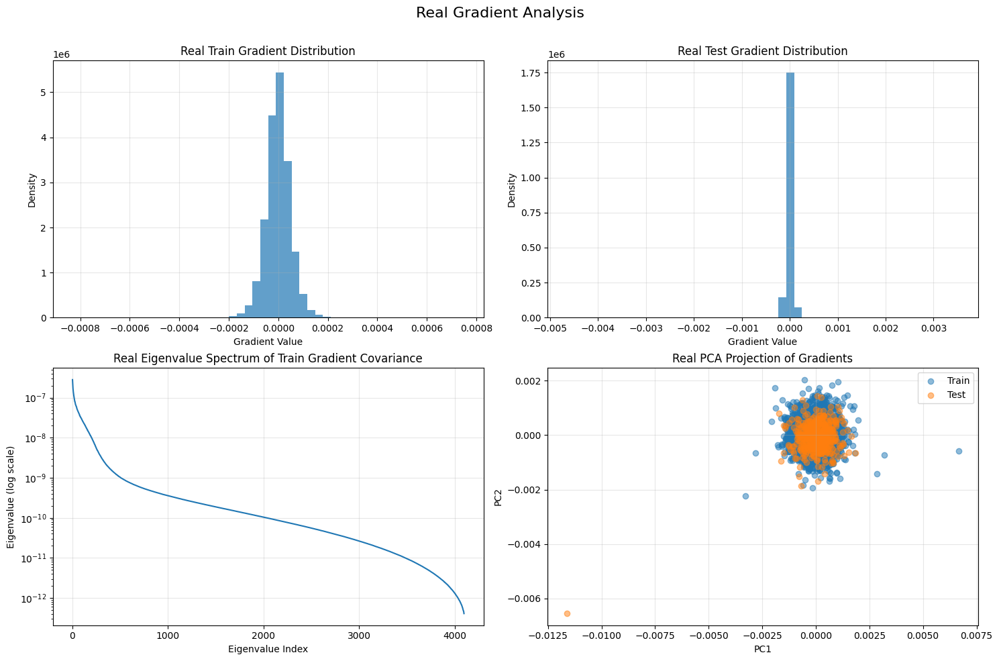

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 9...
[-6.1137827e-05  4.8888055e-06 -7.4878394e-06 ...  1.8239325e-05
  1.5773172e-05  1.2621170e-05]
[ 6.2467457e-06  1.3240458e-06 -4.3820219e-07 ...  1.6199851e-05
  3.7945434e-04  9.9724086e-05]


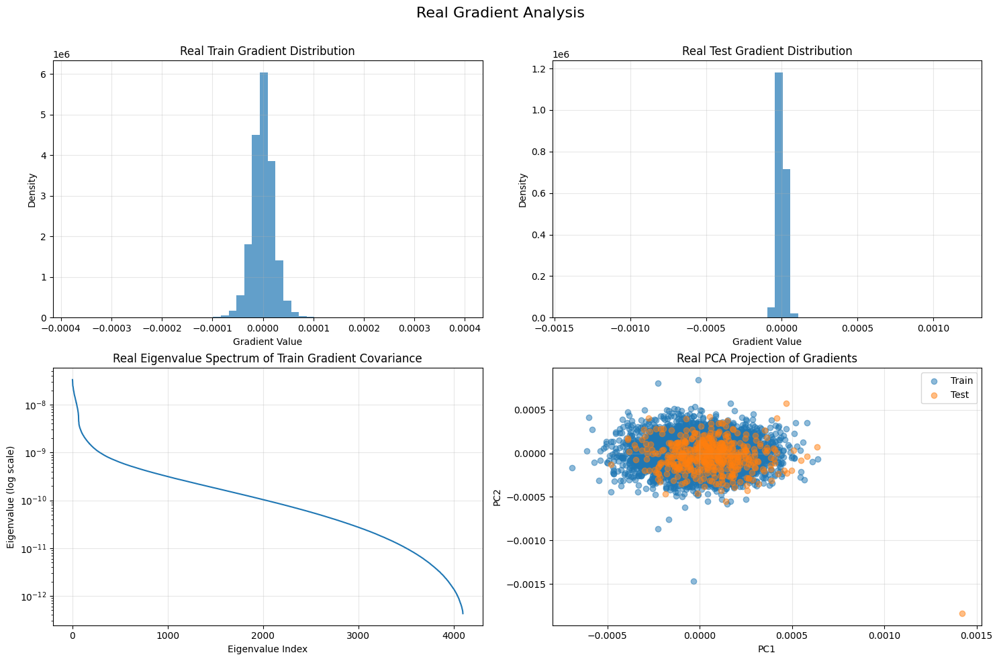

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 10...
[-4.1950949e-05  5.5858900e-06  5.6501262e-06 ...  7.2686555e-05
  3.3067659e-05 -2.2387168e-05]
[ 4.9594191e-06  3.9039864e-05  2.3246941e-05 ...  2.5474248e-04
 -5.8592163e-04  1.1307912e-04]


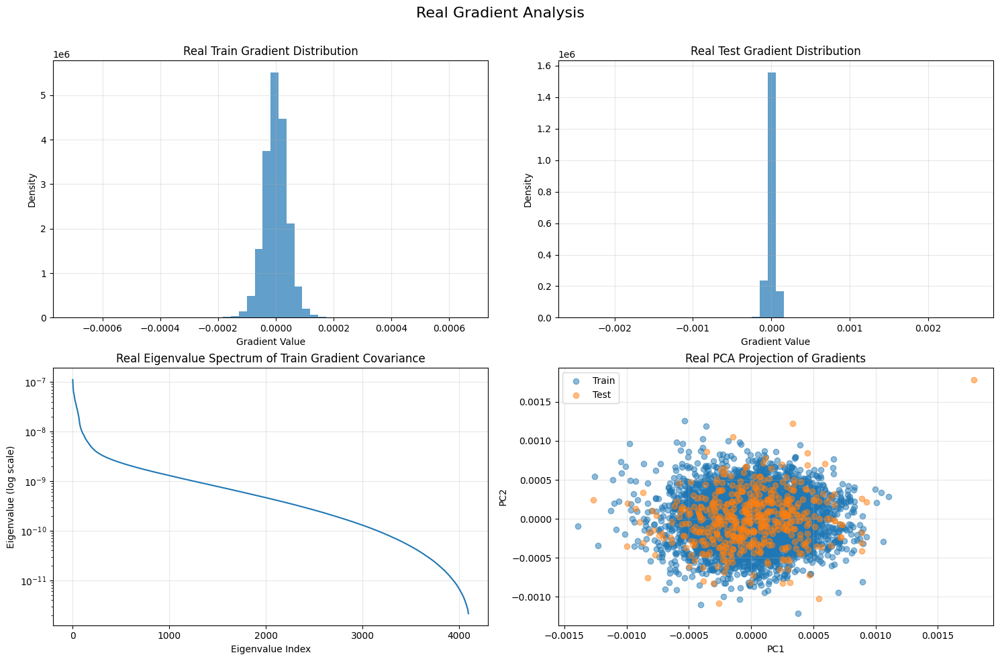

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 11...
[ 5.4092226e-07 -4.5591942e-06  4.1457908e-05 ... -2.3070159e-05
 -1.9853901e-06  6.0900638e-06]
[ 7.5558928e-06  3.2900010e-05  2.3433091e-05 ...  1.4216712e-04
 -1.8579885e-06 -1.3500052e-05]


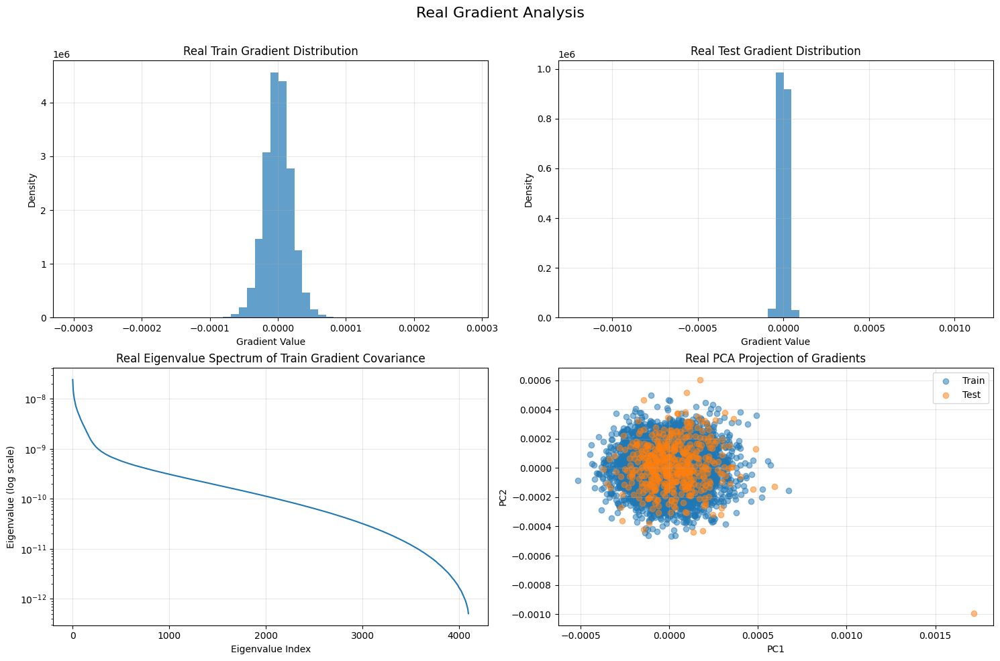

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 12...
[-8.3338899e-05 -1.6637005e-05 -5.8611213e-06 ...  3.0789481e-05
 -2.6750649e-05  6.1339335e-05]
[-2.7949705e-05  1.1915373e-06  6.3975017e-06 ... -3.8611048e-05
  6.9053203e-07  3.3332495e-04]


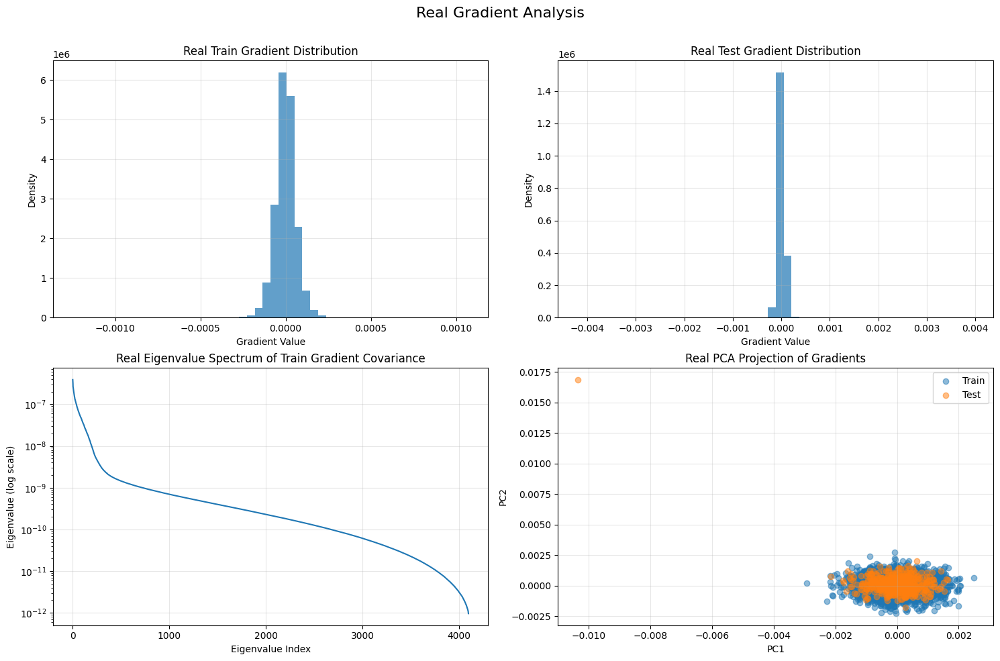

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 13...
[ 3.1248062e-05  3.2157412e-05  6.9814023e-06 ...  1.5506424e-05
 -6.8506606e-06  1.3626057e-05]
[-3.37141671e-07  1.47205201e-05 -1.25602946e-05 ...  1.37066017e-05
  1.11505906e-04 -2.14945161e-04]


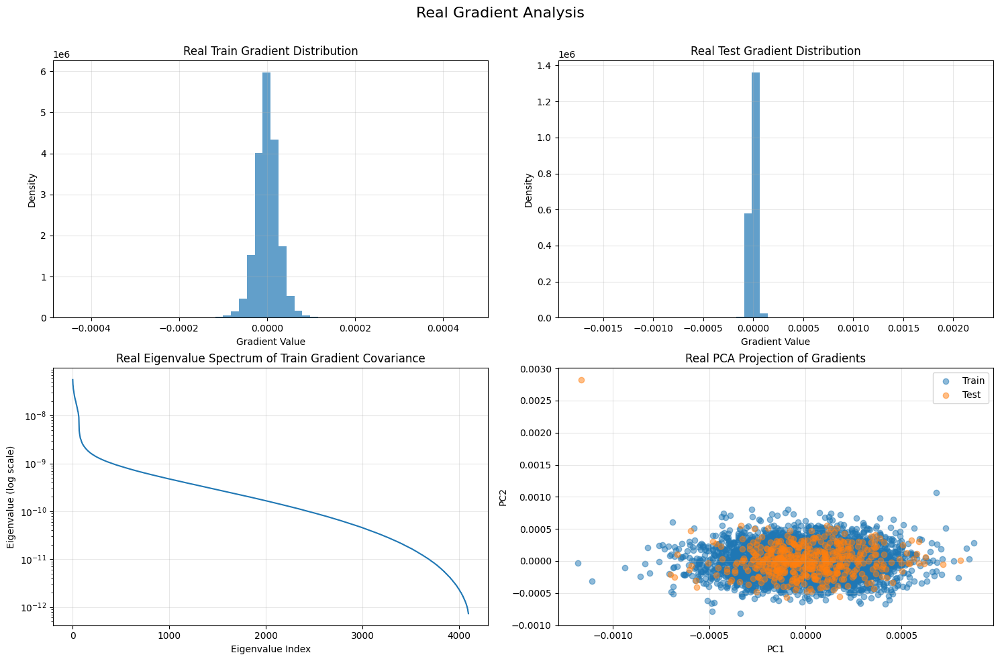

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 14...
[-6.5277483e-05  7.0779397e-06 -2.6515765e-05 ... -5.1392592e-05
  6.8763744e-05 -5.9953759e-06]
[ 6.5847821e-06  3.5689529e-05  1.4459160e-05 ... -6.2230625e-05
  2.1707387e-04  2.7807322e-04]


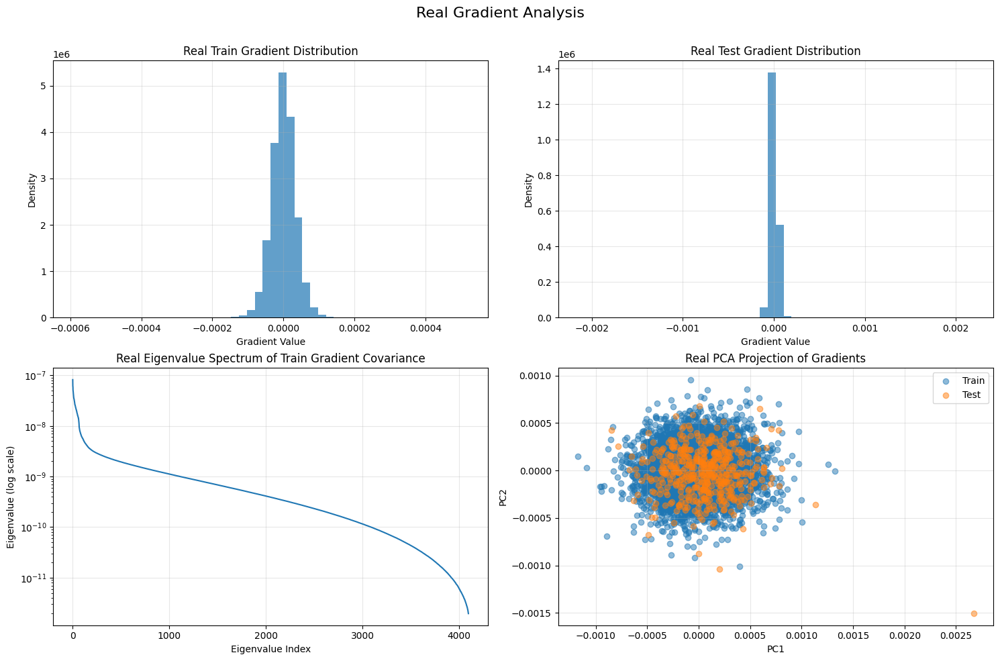

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 15...
[ 5.8710357e-06  7.0109841e-06 -1.4361868e-06 ... -7.6532951e-06
  1.6185180e-05 -1.3156332e-06]
[ 9.5547875e-06 -1.2077837e-05 -1.3799347e-05 ... -8.5907996e-06
  1.2498362e-04 -1.9610257e-04]


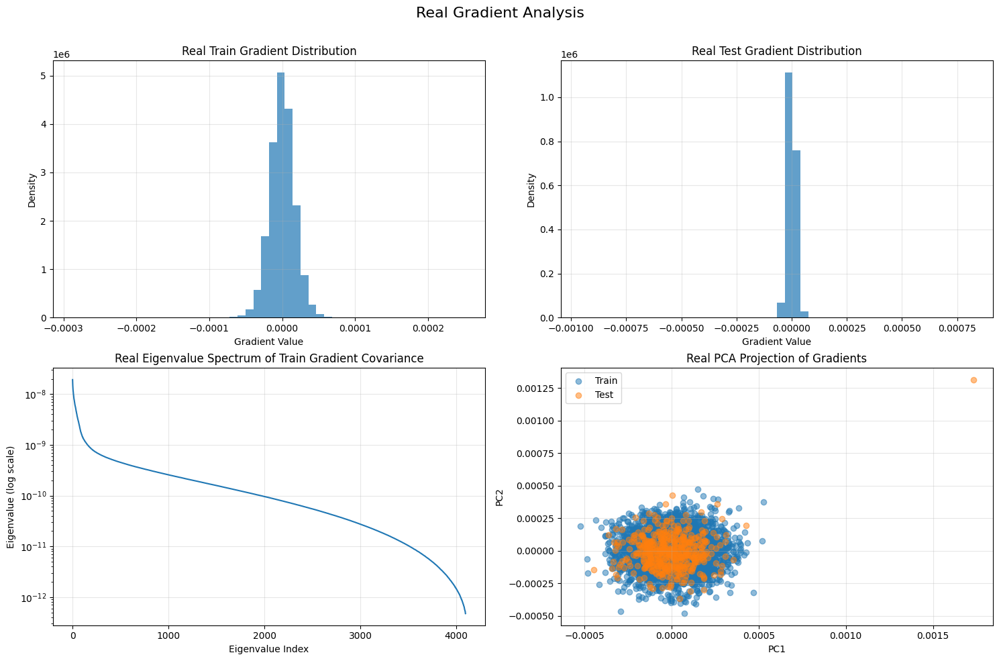

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 16...
[-4.9049035e-05 -7.9014746e-05  4.8673257e-05 ... -1.9139196e-05
 -2.4133609e-05 -7.5375574e-05]
[ 1.0835874e-06 -6.8746958e-05 -1.3406695e-05 ... -1.4743439e-03
  1.2261414e-03  1.3859947e-03]


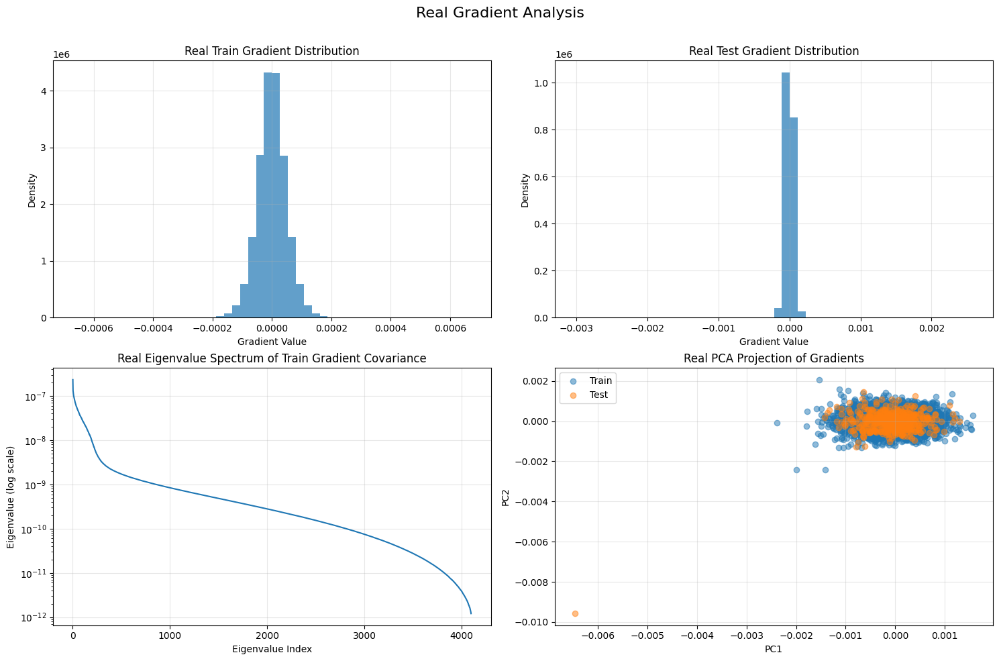

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 17...
[-1.6178485e-05  6.8978409e-07  3.2411943e-05 ...  4.1841260e-05
  1.3664017e-08 -4.3357836e-06]
[-1.2792615e-06 -1.1467822e-05 -2.5638938e-05 ...  2.1321949e-04
 -1.0484241e-04  2.0249499e-04]


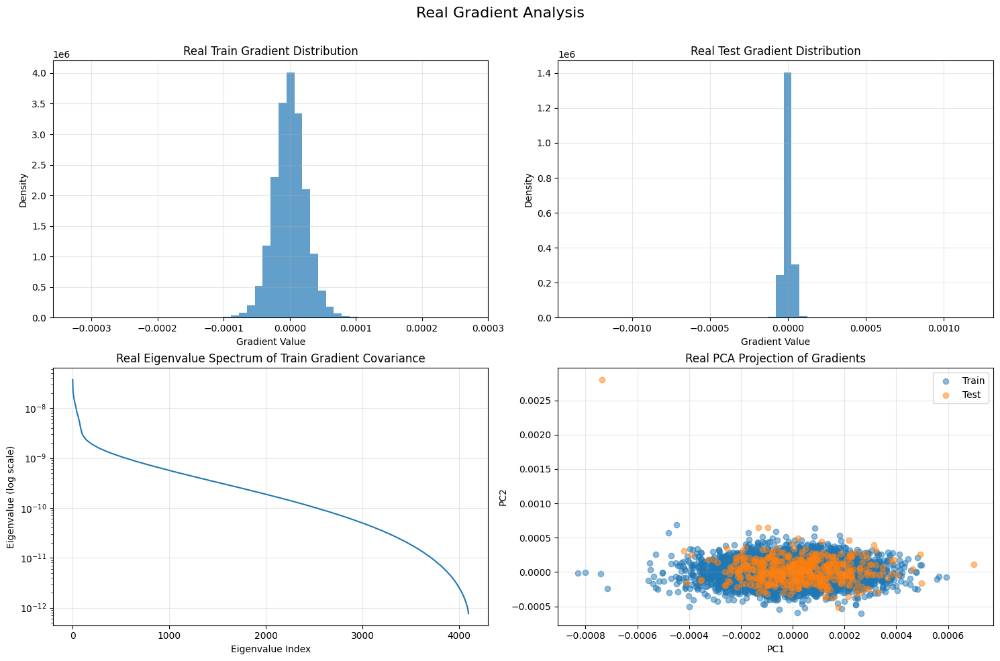

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 18...
[-8.657290e-06  4.561827e-06 -5.534612e-05 ... -3.899463e-05 -2.861191e-06
  4.388635e-05]
[ 5.5495973e-05  9.3772051e-06  7.8903995e-06 ... -3.9318603e-04
  1.1809607e-04  2.9005445e-04]


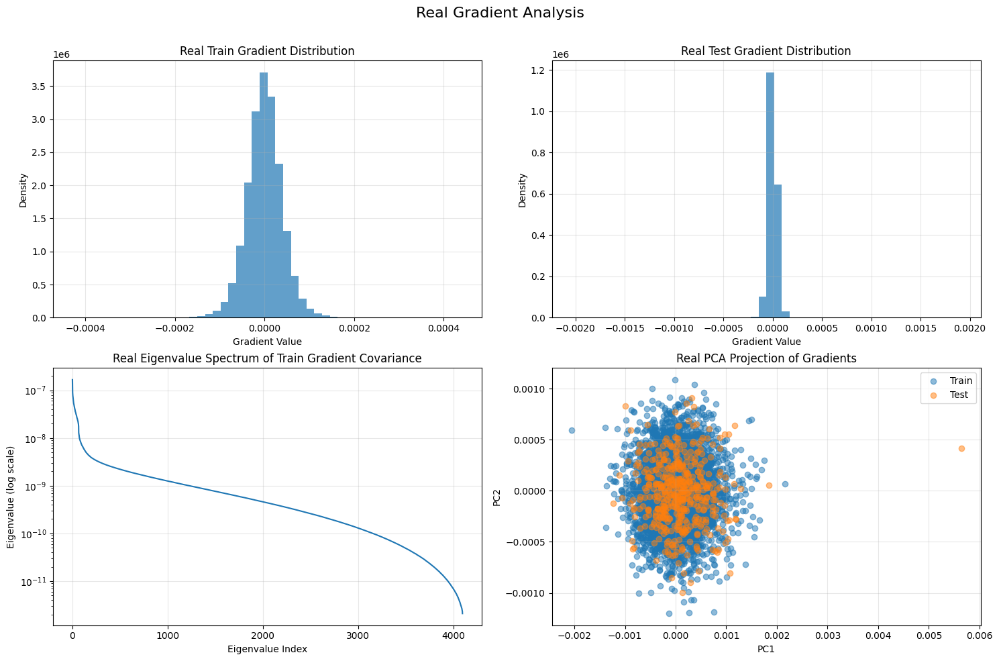

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 19...
[-6.6948696e-06 -1.7978866e-05  1.2977848e-05 ...  2.3544530e-06
  9.1727698e-06  1.3137605e-05]
[-1.8999861e-05 -1.9957897e-06 -9.7443772e-06 ... -2.0421705e-04
 -1.0874290e-04  2.2868664e-04]


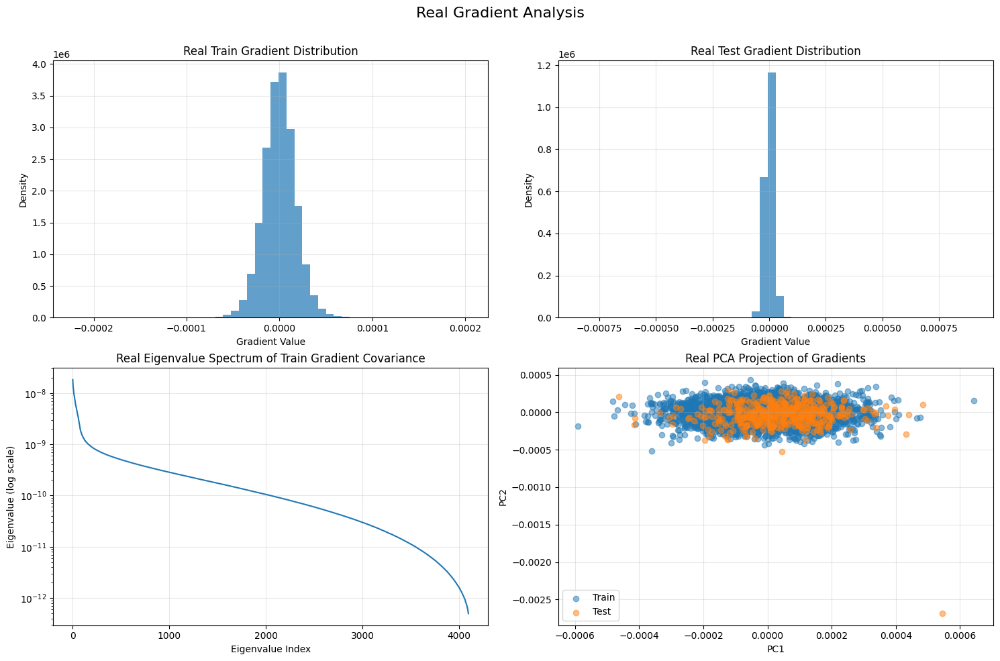

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 20...
[ 3.4300916e-05 -3.6191232e-05 -4.8871494e-05 ...  3.0110537e-05
  5.1765574e-07 -1.7176326e-05]
[-5.2908654e-05  1.8022178e-05  6.0994225e-06 ... -6.6333369e-04
  3.4703058e-04  1.9003228e-04]


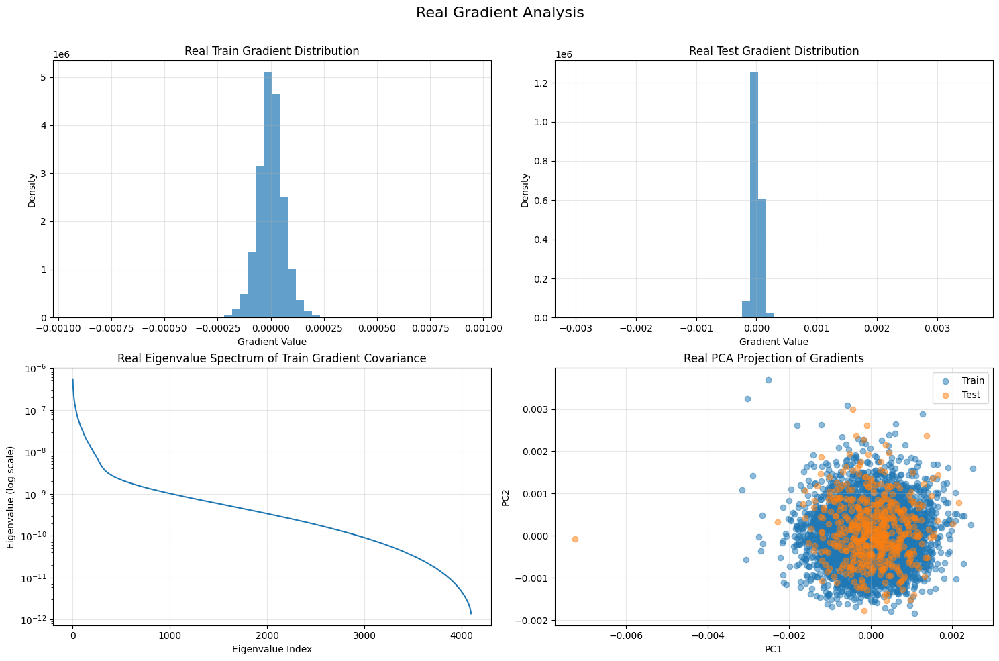

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 21...
[-1.2474295e-05 -9.1124793e-06  1.5217896e-05 ...  1.7394908e-05
  1.2840252e-05 -1.3071393e-05]
[ 7.2388971e-06 -2.2531396e-05  1.5426759e-06 ...  5.4240279e-04
  2.7632905e-04 -4.4153020e-04]


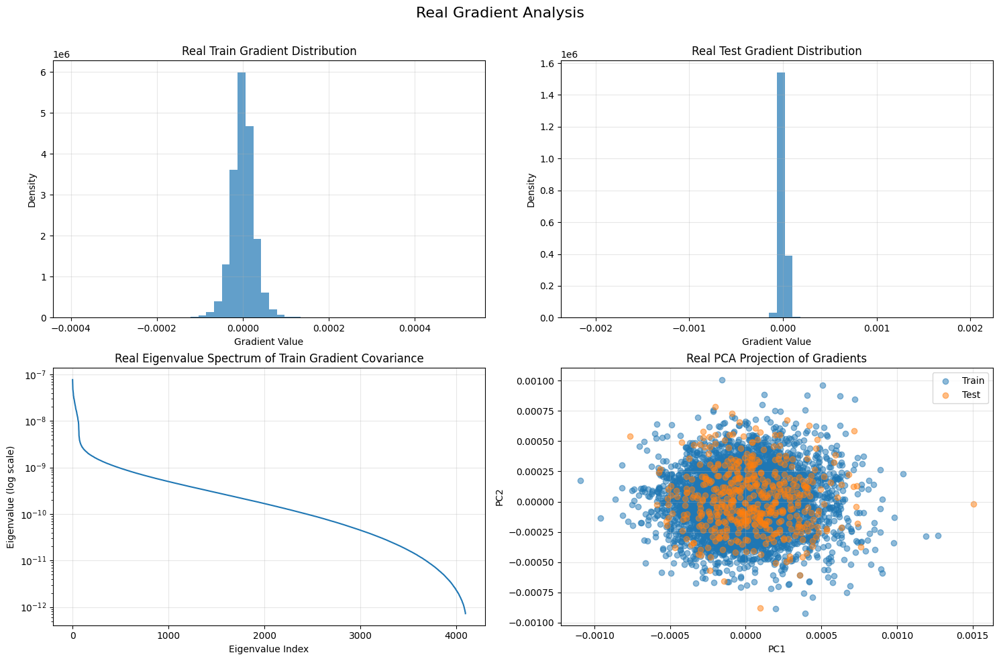

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 22...
[ 1.4228642e-06  4.3007862e-05  9.6645490e-06 ... -1.2147413e-05
 -4.6033409e-05  1.2688614e-05]
[-4.9477709e-05 -5.4000616e-06  4.8520749e-05 ...  3.1471532e-04
 -3.4831773e-04  7.7678543e-04]


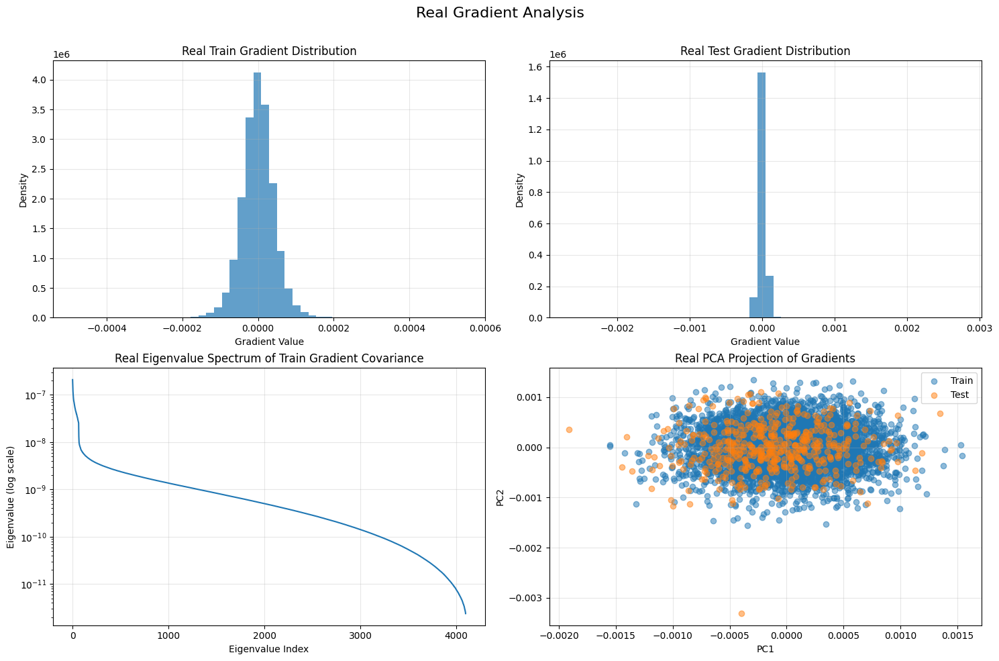

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 23...
[-4.7106332e-06  2.3020148e-06  1.7687786e-05 ...  9.3750232e-06
 -6.7838819e-06  1.4271999e-06]
[ 3.2960104e-06  5.7276961e-06 -6.9871831e-08 ... -2.5362469e-04
 -5.3164178e-05  2.8018148e-05]


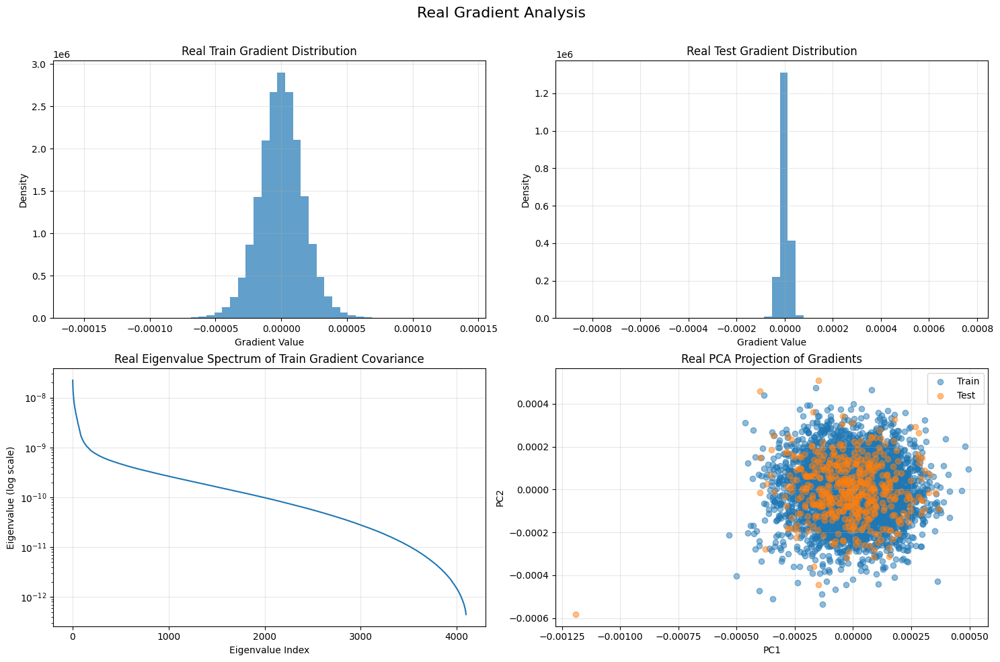

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 24...
[ 3.3570161e-06 -4.6874535e-05 -2.9880606e-05 ... -1.8218145e-05
 -1.5167355e-04 -4.5150719e-05]
[ 5.4482036e-05  2.4905561e-05 -3.7769707e-05 ...  4.1224808e-04
  3.3194030e-04 -8.5863995e-04]


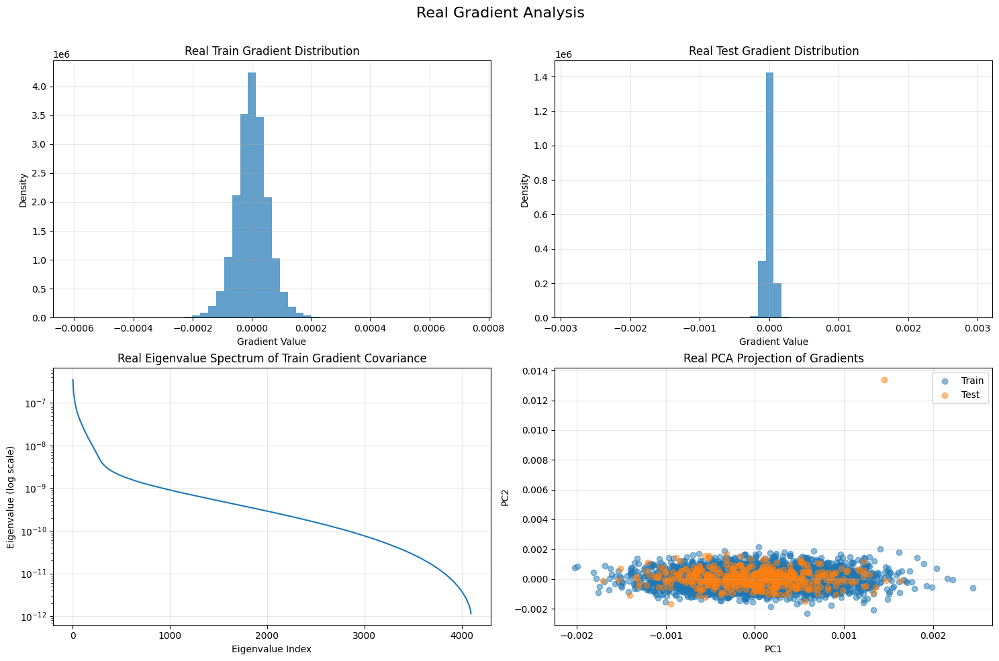

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 25...
[-5.3960430e-06 -2.4366882e-05 -9.6709491e-06 ...  1.3549458e-05
  1.7127973e-05 -3.1910153e-05]
[-2.99826406e-05 -1.05925324e-07  1.31079980e-06 ...  3.15700454e-05
 -1.09388297e-04 -4.28414991e-04]


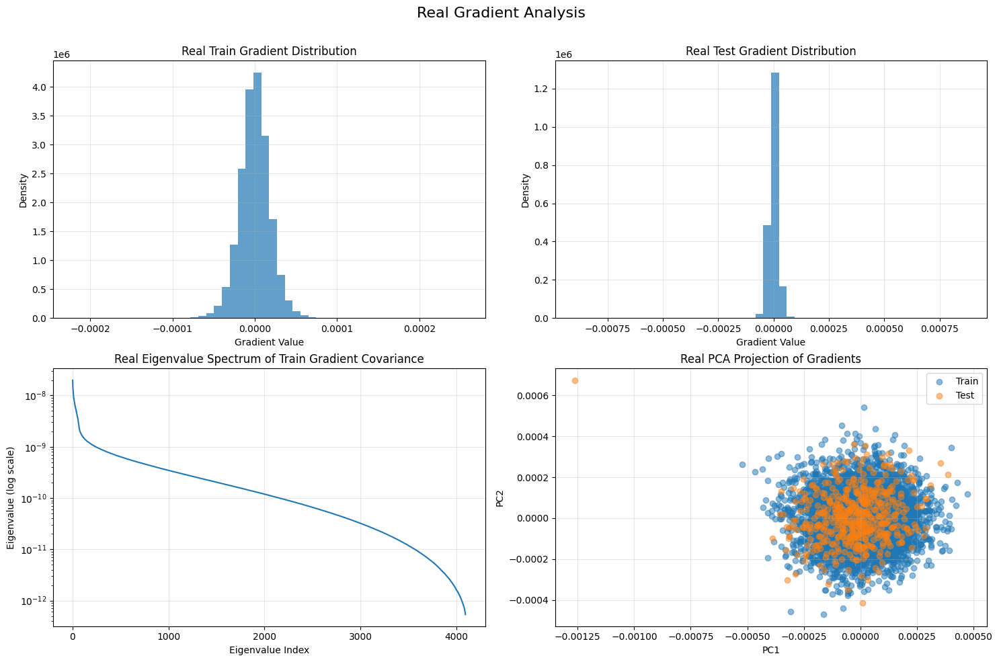

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 26...
[-1.2069884e-05  3.2525655e-05 -6.8019685e-06 ... -1.3418066e-05
  2.4901394e-05 -2.8330021e-05]
[-4.4298693e-05  8.3325584e-05 -8.7083426e-05 ... -4.5260898e-04
 -2.2376853e-04 -1.5799109e-04]


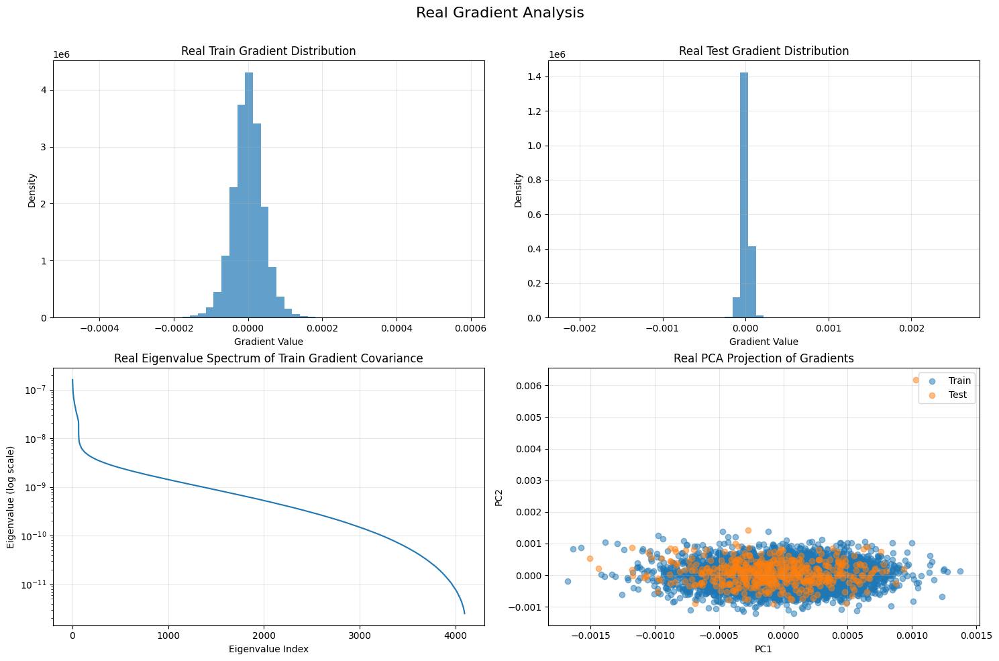

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 27...
[ 2.5608679e-05  1.1805910e-05  3.0522610e-06 ... -2.4202507e-06
  1.6516250e-06  5.5875626e-06]
[ 1.0255439e-05  9.1669363e-06 -3.3033386e-06 ...  2.8025146e-04
  9.9459408e-05  1.0595795e-04]


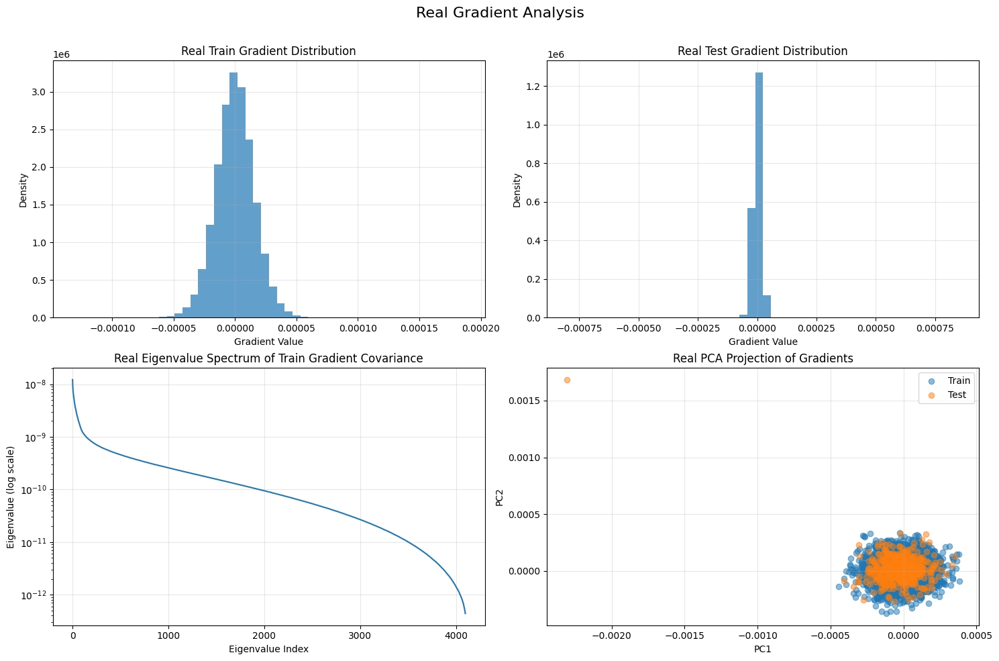

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 28...
[-1.0303348e-05  1.8041321e-07 -1.1335675e-05 ...  4.6990717e-06
  4.0525374e-05 -5.0281553e-05]
[-2.1148489e-05  1.3459132e-06 -1.7337648e-05 ... -1.2101800e-04
 -6.6857750e-04  1.5269044e-03]


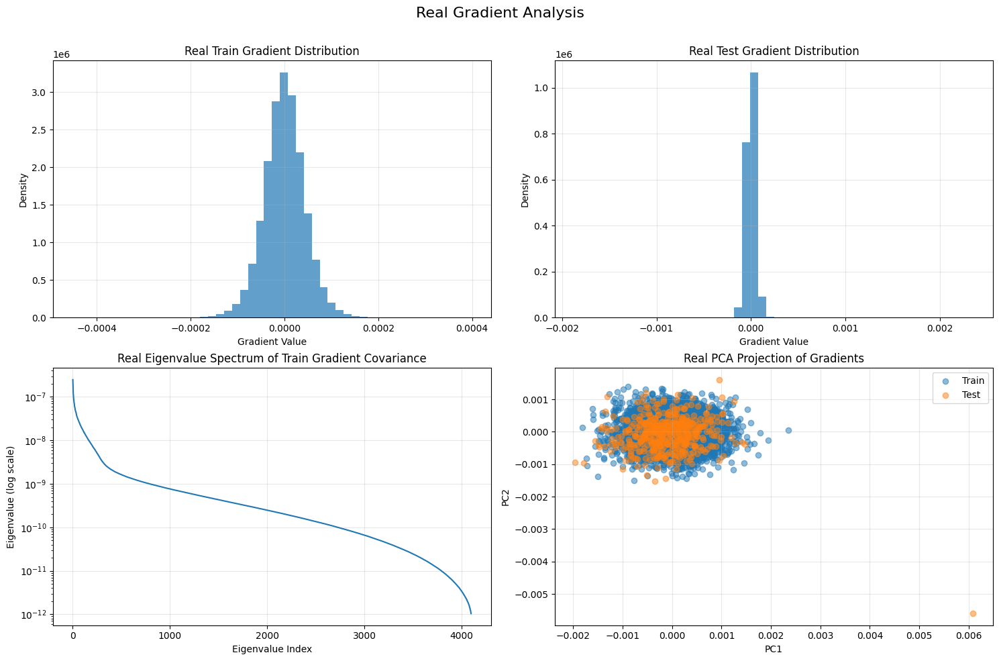

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 29...
[ 2.4943414e-05  3.7282177e-06 -4.9483538e-06 ...  1.3366409e-07
  8.6793325e-06 -3.7723066e-06]
[-2.2279660e-06  1.8938494e-05 -1.9362601e-06 ...  2.6314119e-05
 -3.2707435e-04  3.6055667e-04]


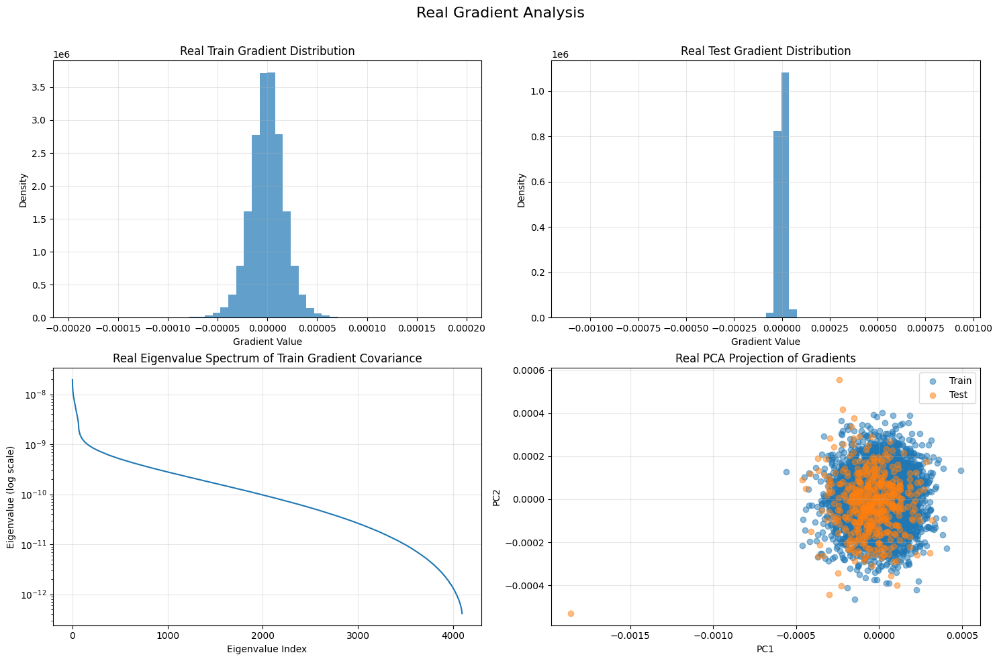

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 30...
[ 2.7332821e-05 -4.8801303e-05  2.6404792e-05 ...  4.0554170e-07
  1.8692277e-05 -8.8084171e-06]
[-3.3807177e-05 -5.5675937e-05 -2.5423262e-06 ... -3.7120696e-04
 -3.0141469e-04 -7.6775148e-05]


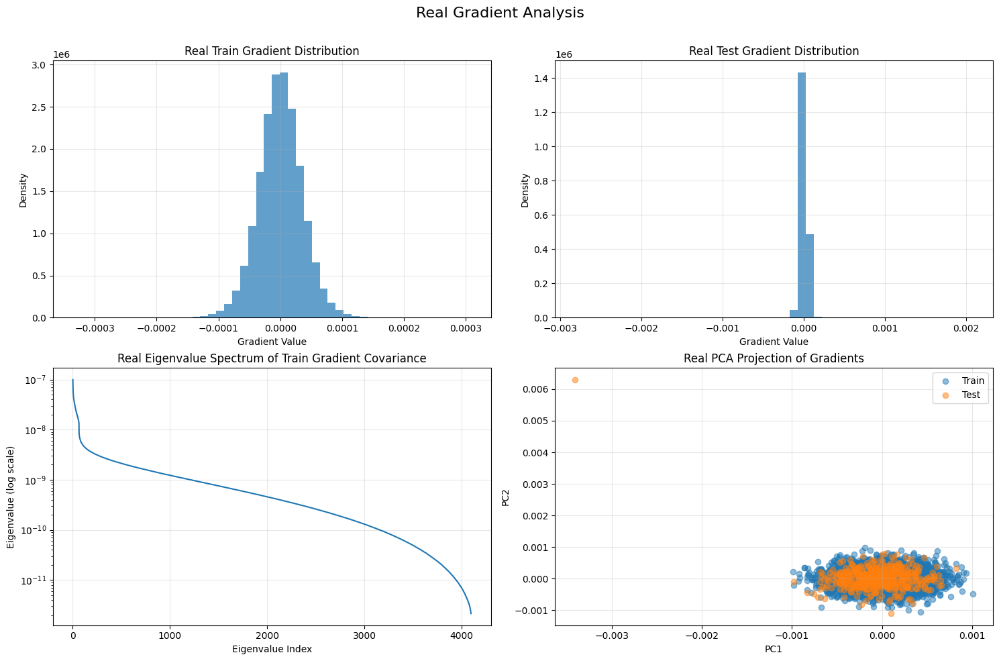

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 31...
[ 8.7968169e-07 -1.9388197e-05 -1.0729747e-05 ...  2.0272408e-05
  9.4343350e-06  7.8531612e-06]
[ 8.0225072e-06 -5.8772771e-06  9.1621050e-06 ...  1.6749784e-04
  1.0416185e-04 -4.2351679e-04]


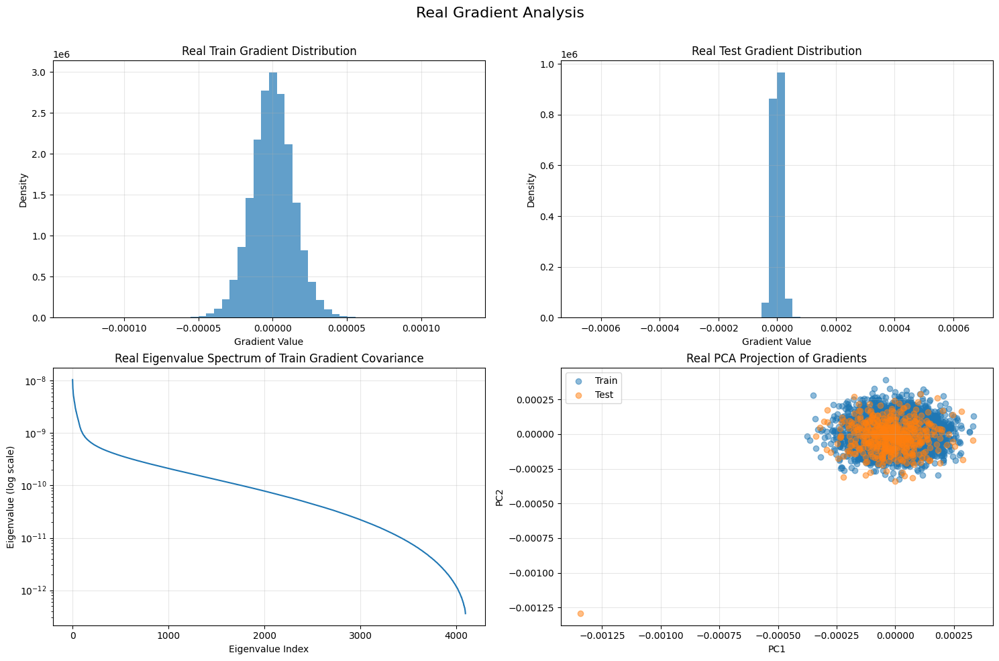

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 32...
[-3.8878505e-05 -1.6457403e-05  3.2347085e-05 ... -2.4201436e-05
  4.9184815e-05  6.6880580e-06]
[ 2.0188181e-06 -2.4844869e-05  7.0329594e-07 ...  8.0166465e-06
  1.0976345e-04 -1.4311176e-04]


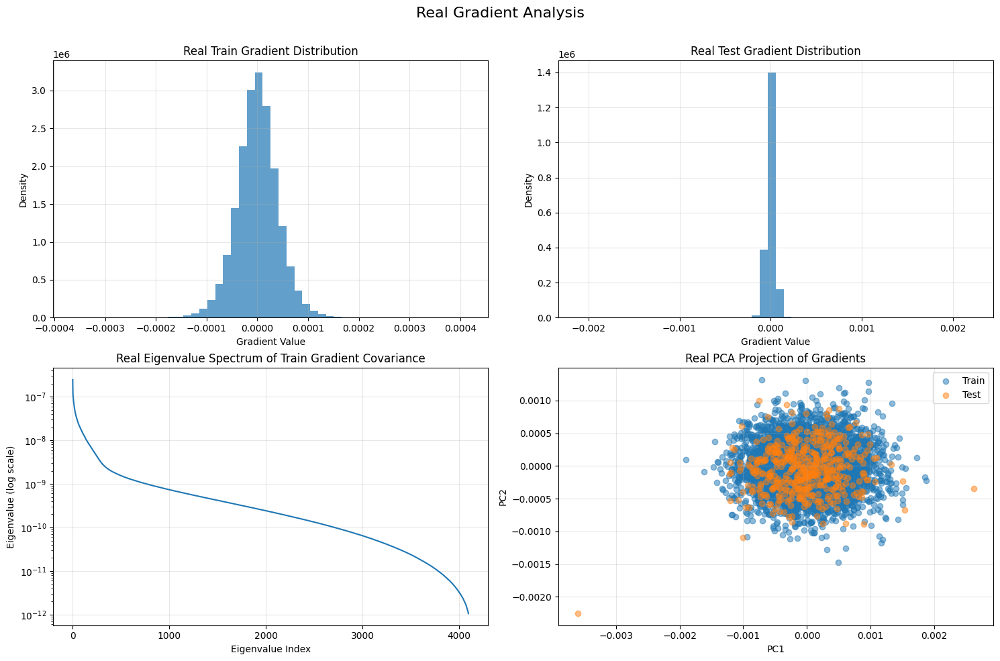

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 33...
[-2.5133271e-05  7.8191106e-06  9.7381587e-08 ...  3.8356775e-06
 -8.1868910e-07  6.8592140e-06]
[ 9.7630282e-06 -1.9064084e-06  3.7114674e-05 ... -7.1959512e-05
 -3.4749223e-04  5.5130909e-04]


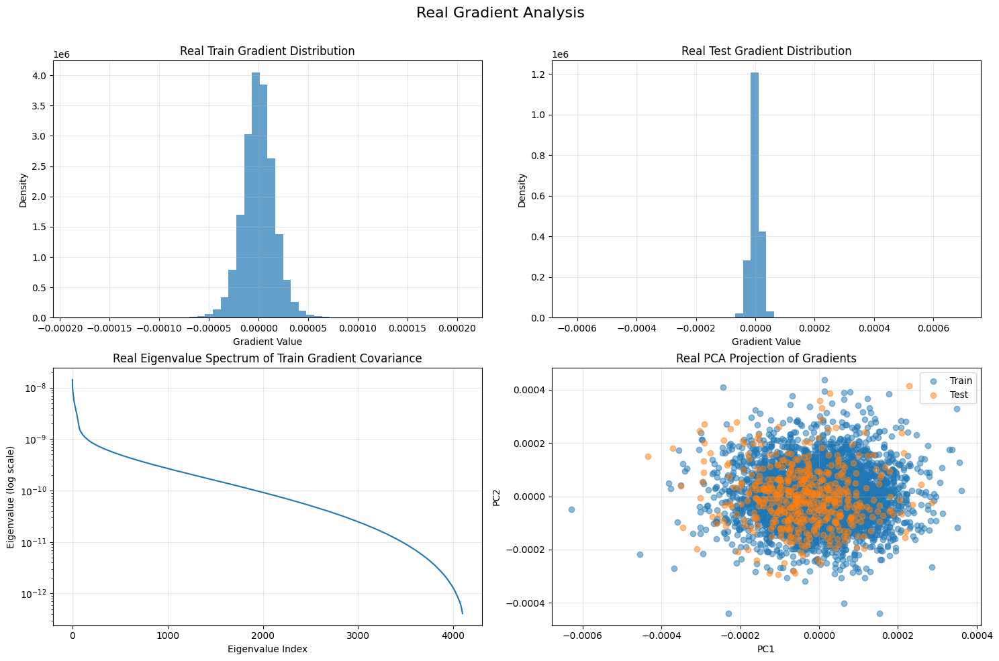

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 34...
[ 3.3079796e-05 -4.2089370e-05 -2.3456201e-05 ... -2.0470809e-05
 -4.3889217e-05 -3.2442822e-05]
[ 2.6609869e-05  1.5393236e-06  4.5151195e-05 ... -9.7982105e-05
  2.5102735e-04  7.6621865e-05]


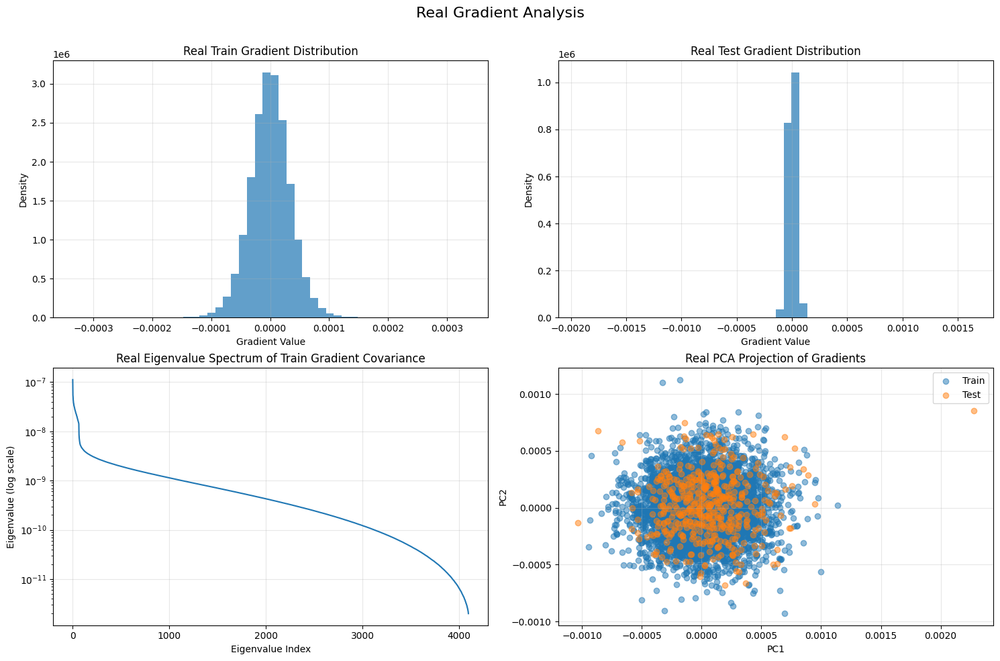

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 35...
[-2.0338692e-05  1.0887653e-06  5.7373563e-06 ... -1.2634936e-05
  1.2128969e-05 -2.4682436e-06]
[-1.2919238e-05  3.8559560e-06  1.0486081e-05 ... -9.3639697e-05
  2.9460504e-04 -2.4430010e-05]


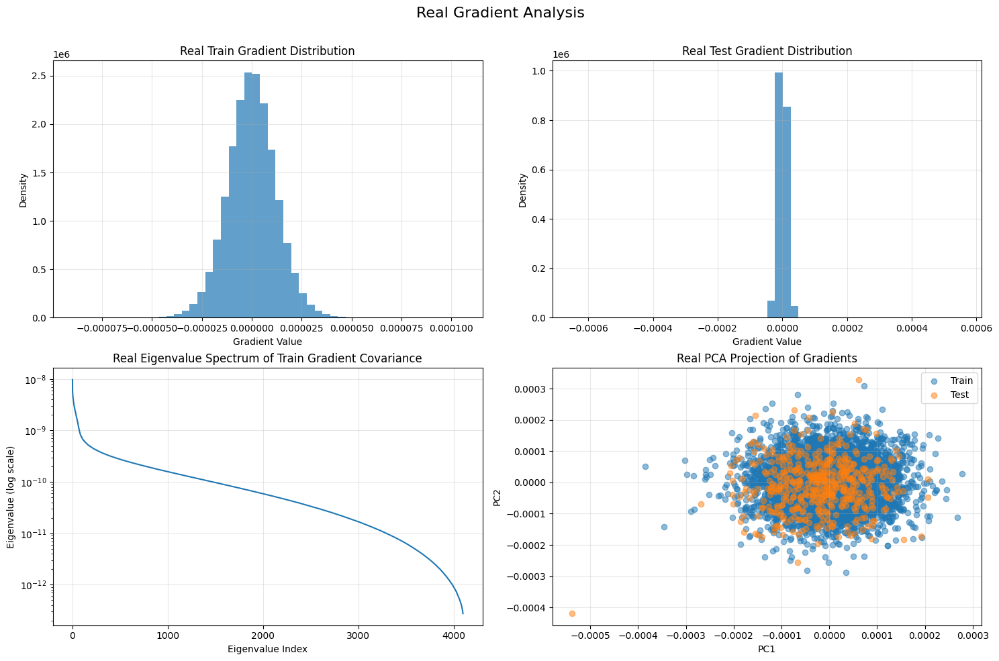

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 36...
[ 2.6409809e-05  1.8756220e-05 -1.9796402e-05 ...  8.8041033e-06
 -2.6488349e-05  1.6731739e-05]
[ 5.2620464e-05  2.2511696e-05  1.9349722e-05 ... -2.2230009e-04
 -2.2733046e-04 -2.7875503e-05]


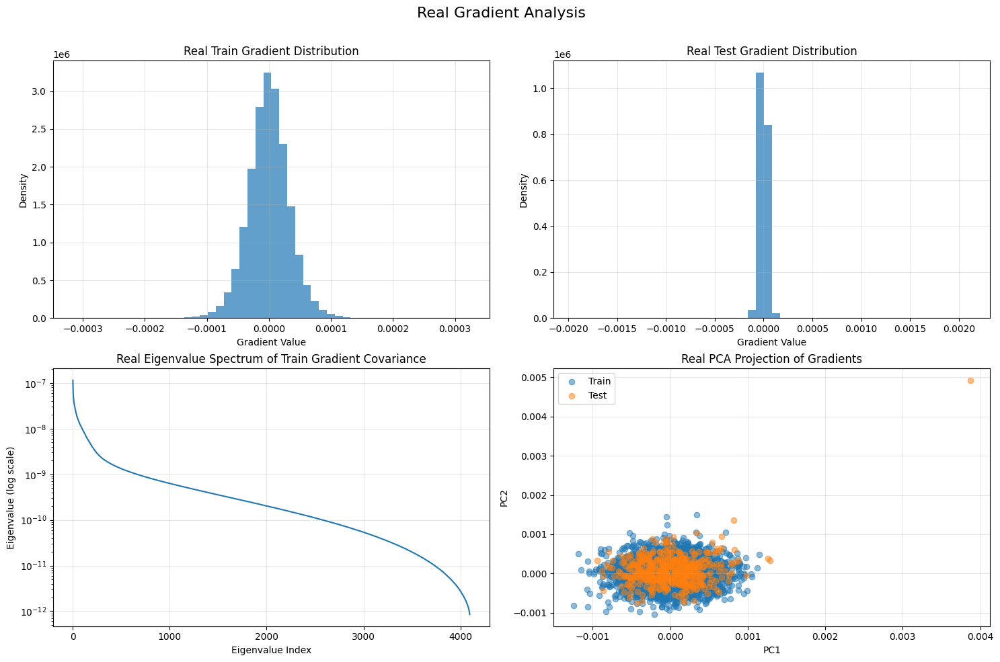

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 37...
[-2.4689707e-05  2.2573206e-06  2.6300248e-05 ...  8.2131936e-07
 -5.1248544e-06 -3.9165309e-07]
[-4.4816949e-05  4.8722982e-06  1.2458695e-05 ...  3.6535941e-05
  2.0917418e-05  9.6587661e-05]


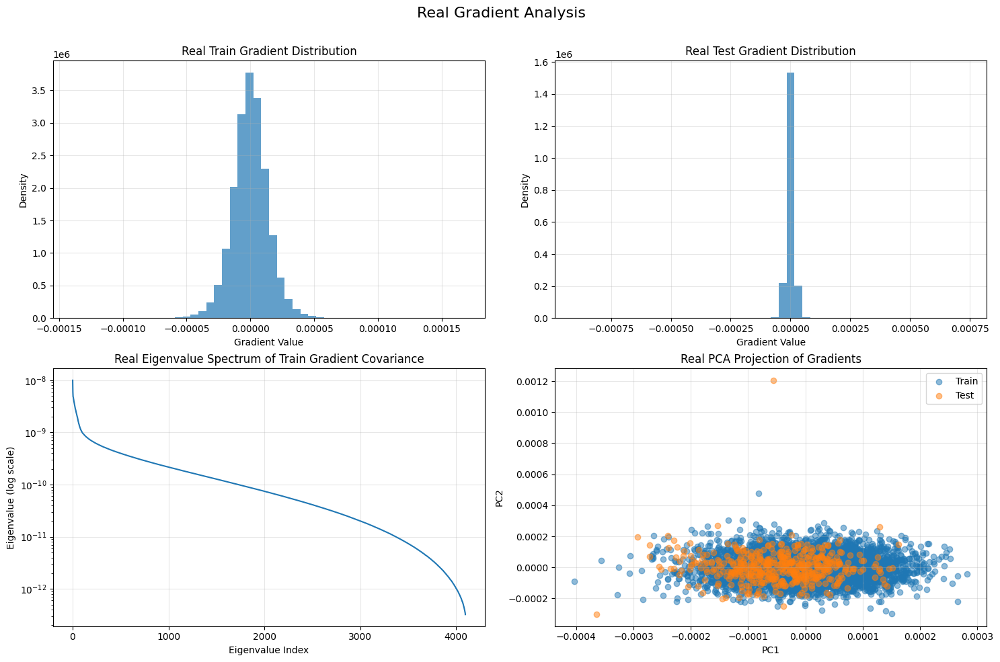

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 38...
[ 9.2276632e-06  3.6509533e-05  1.5138275e-05 ... -1.5703961e-05
 -3.1168365e-05 -1.6532944e-05]
[-2.31366448e-05  2.82174387e-05 -1.85845181e-06 ...  1.95302346e-05
 -2.98160012e-04  1.11090034e-04]


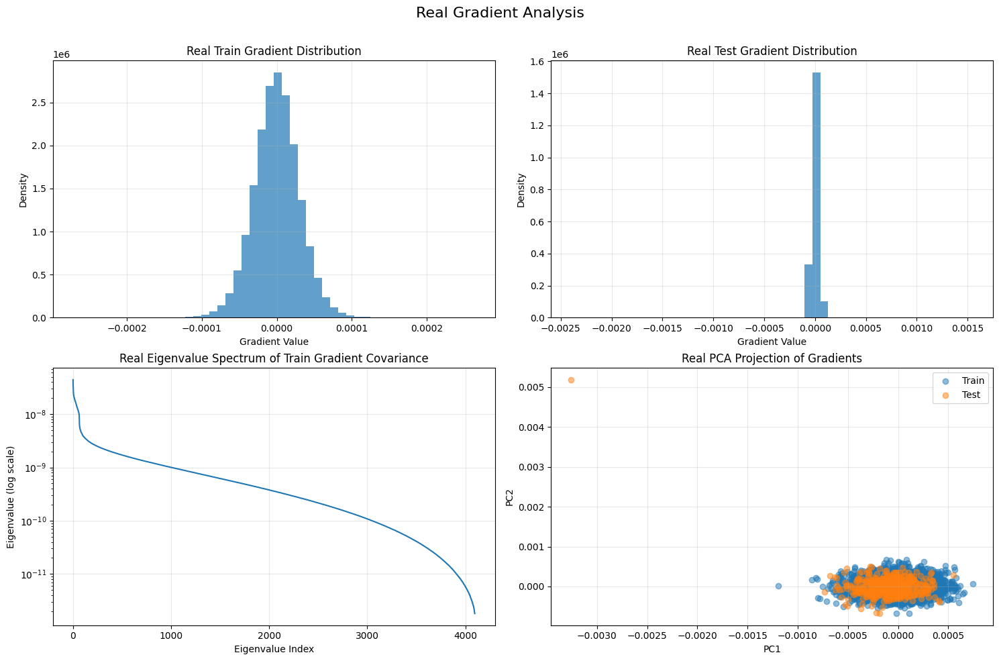

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 39...
[-2.0226411e-05  3.7250716e-06 -3.0455451e-06 ... -4.4884378e-06
 -1.8664492e-05 -2.7497672e-06]
[-8.9164478e-06 -5.5056248e-06 -3.8481926e-06 ... -6.1601029e-05
 -3.8448995e-04 -4.8409027e-05]


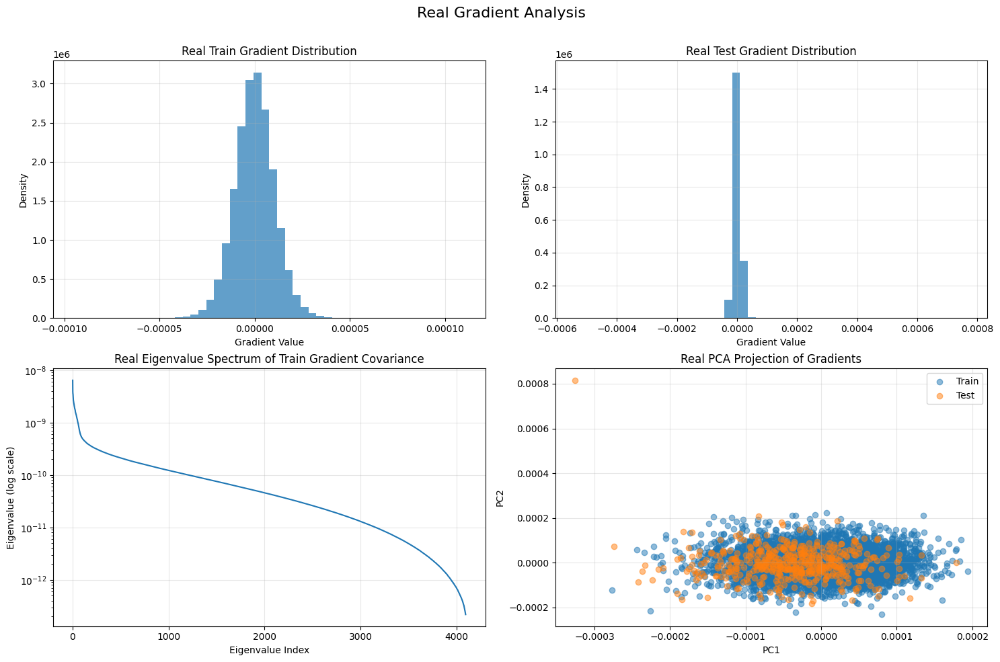

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 40...
[-4.4764922e-05 -4.7953913e-06 -1.1293090e-05 ... -3.4092340e-05
  1.1044213e-05  2.0867635e-06]
[ 1.4409970e-05 -2.7514548e-05 -3.4661574e-05 ...  4.0063340e-05
  1.6547494e-03  5.5434539e-05]


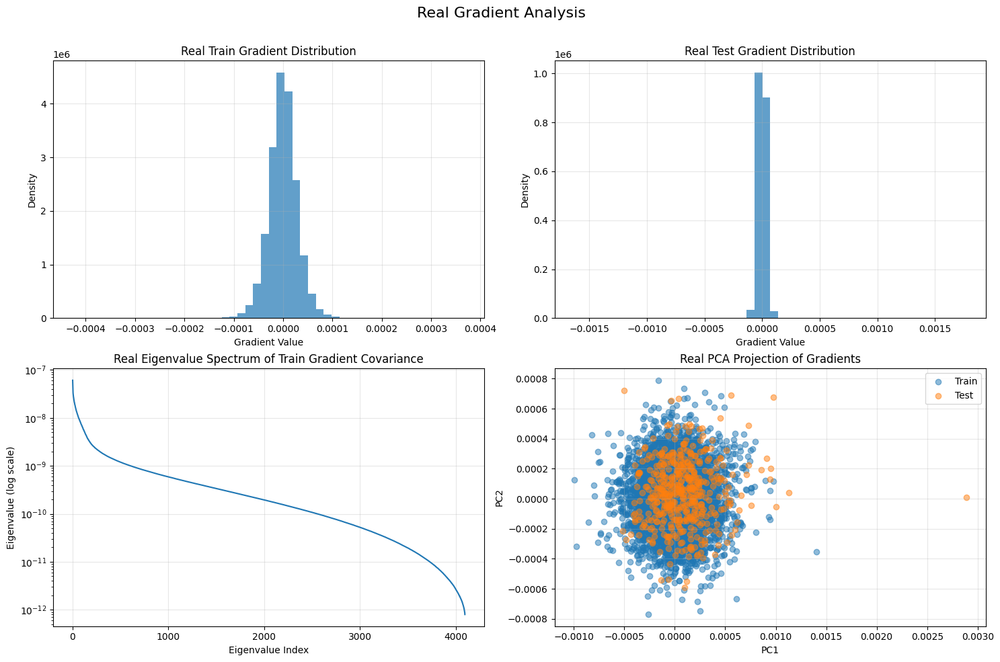

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 41...
[-7.15617989e-06  1.15327175e-05  5.58585862e-06 ...  1.00883808e-05
 -3.53236987e-06  6.95184463e-06]
[-1.1618712e-05  5.7622469e-06  1.2739516e-05 ...  1.6846086e-04
 -9.9185134e-05 -2.3563698e-04]


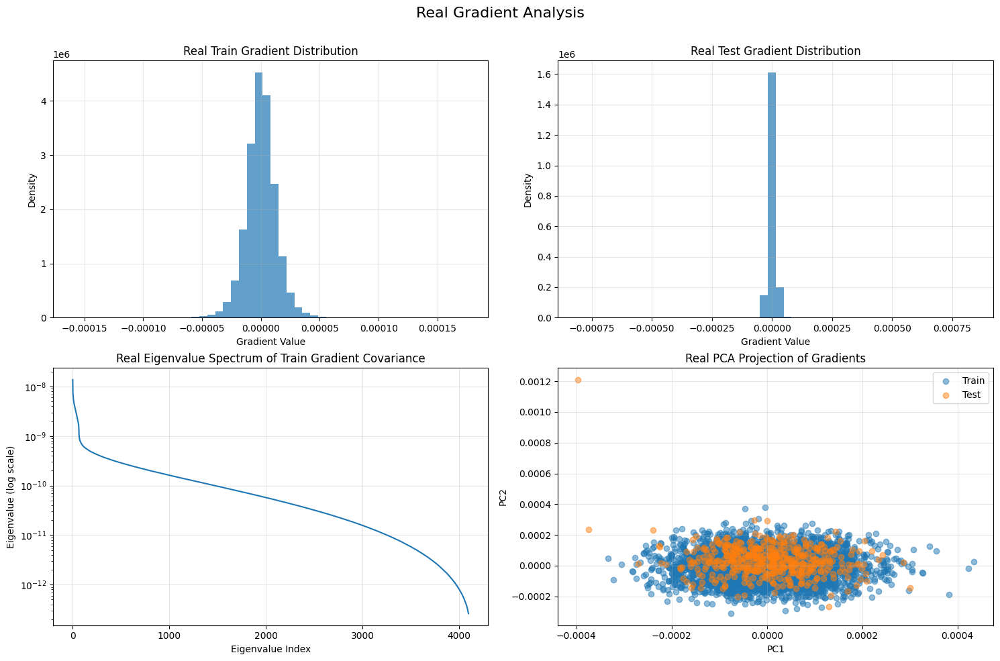

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 42...
[5.6165092e-05 8.8015231e-06 6.1809144e-05 ... 3.1714277e-05 4.3041695e-05
 2.4285720e-05]
[ 5.6300437e-06  2.4409464e-05  1.5248431e-05 ... -3.4012410e-05
 -1.6984926e-04  5.5519387e-04]


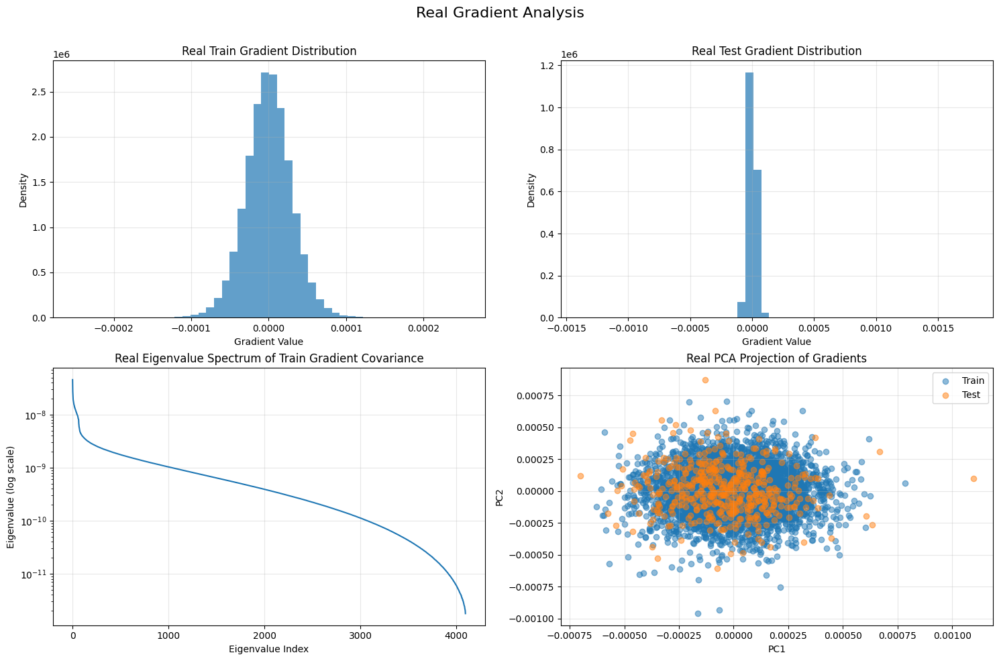

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 43...
[-1.39099450e-06 -1.49359698e-06  1.07202395e-05 ...  9.68416953e-06
 -5.14233852e-06 -1.20703298e-05]
[ 1.0564265e-05 -2.9859441e-06 -1.4299632e-05 ...  3.0746240e-05
  7.3128882e-05 -9.0267677e-06]


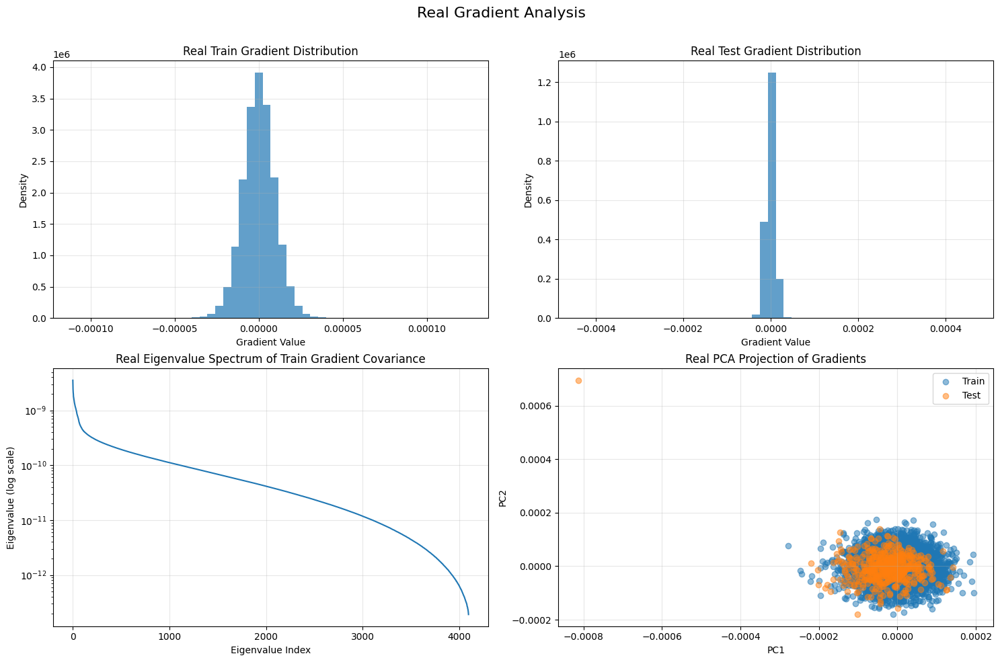

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 44...
[-3.5239129e-06 -1.9688961e-05 -4.6793157e-05 ...  7.9259553e-06
 -1.1520527e-05  2.4499221e-05]
[-7.0326081e-05 -4.8606089e-05  2.3329736e-05 ...  5.4087065e-04
 -1.5453128e-04  1.8319758e-04]


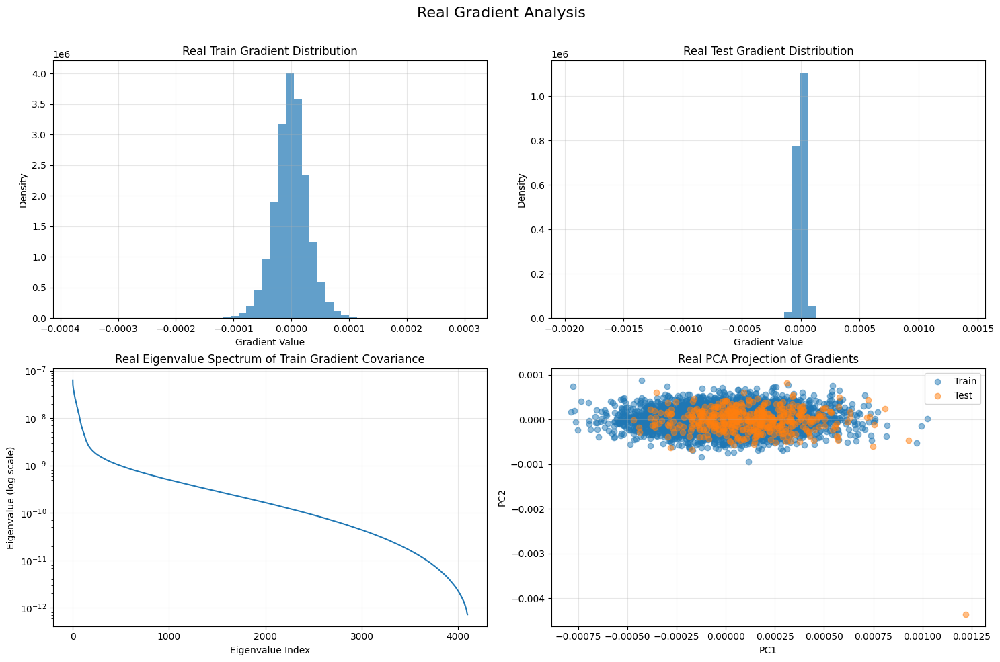

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 45...
[-2.12656250e-05 -1.25270408e-05 -2.30080968e-05 ...  8.02305021e-06
 -1.20895465e-05  5.73462785e-06]
[-1.4297817e-05 -3.4531735e-05 -8.6147975e-06 ... -8.6568616e-05
 -1.0637280e-04  2.6719728e-05]


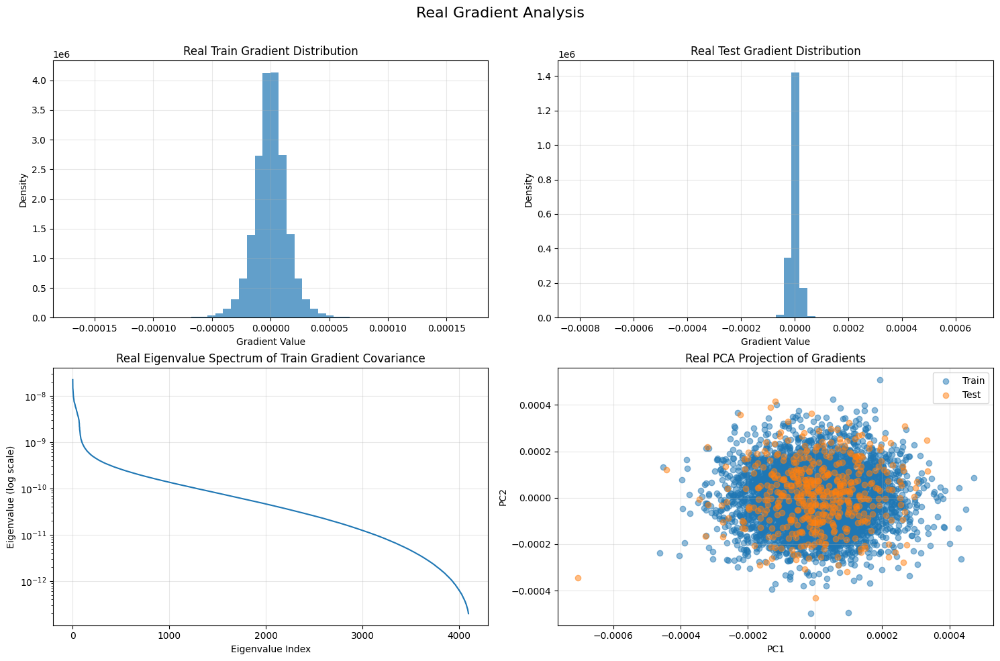

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 46...
[ 7.17975217e-06  1.47413275e-05 -4.77035474e-06 ... -9.40305927e-06
 -4.59301555e-05 -4.94987726e-05]
[-2.40878599e-05 -1.03296625e-05 -6.20285864e-05 ... -1.61361779e-04
 -1.20021097e-04  4.72042942e-04]


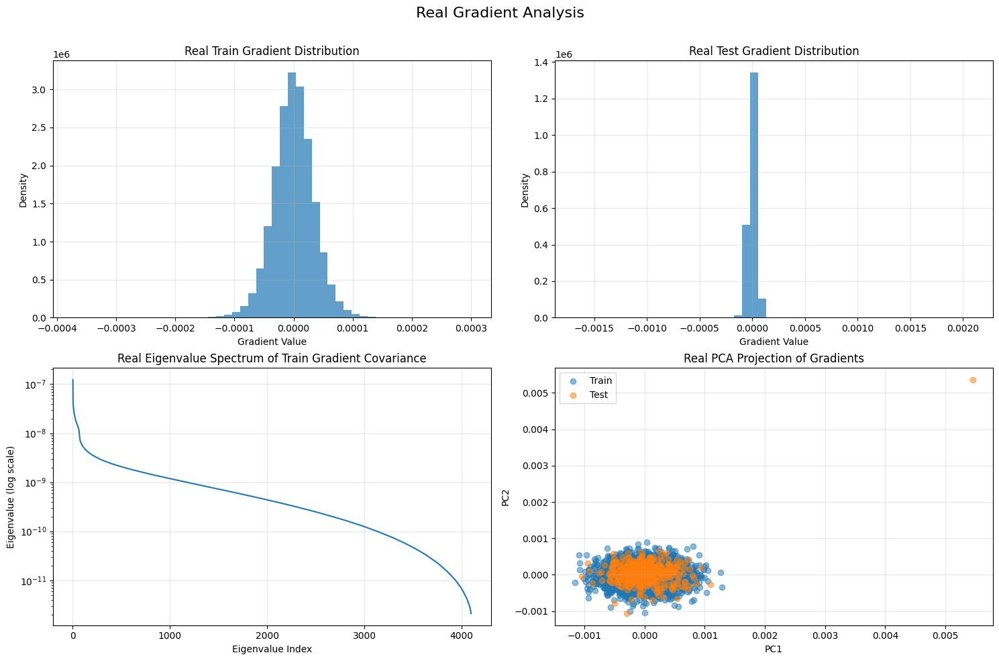

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 47...
[ 7.5659991e-06  1.5881030e-06 -7.1787131e-06 ... -9.7757693e-06
 -2.7079357e-05  2.6471228e-06]
[-1.9930822e-06  1.3180388e-05 -3.7400239e-06 ...  6.3284951e-06
  7.4688378e-06 -2.4782252e-05]


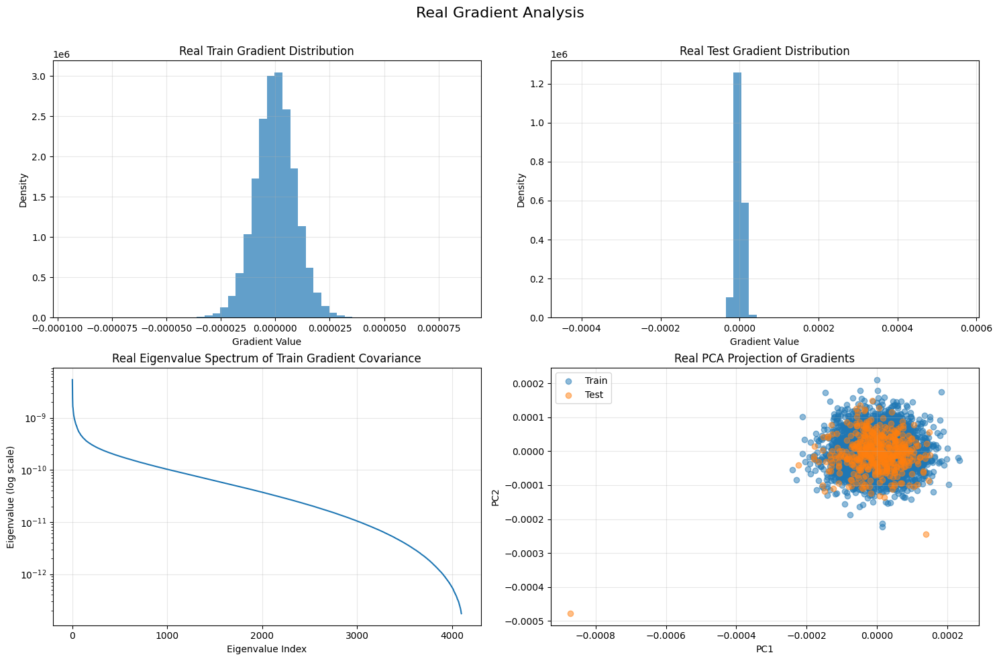

torch.Size([4656, 4096])
torch.Size([481, 4096])
Analyzing gradients for layer 48...
[-0.00113065 -0.00099036 -0.00076635 ... -0.00109692  0.00183376
  0.00048431]
[ 0.00175511  0.00164588  0.00125056 ...  0.00787514 -0.01114073
 -0.00181406]


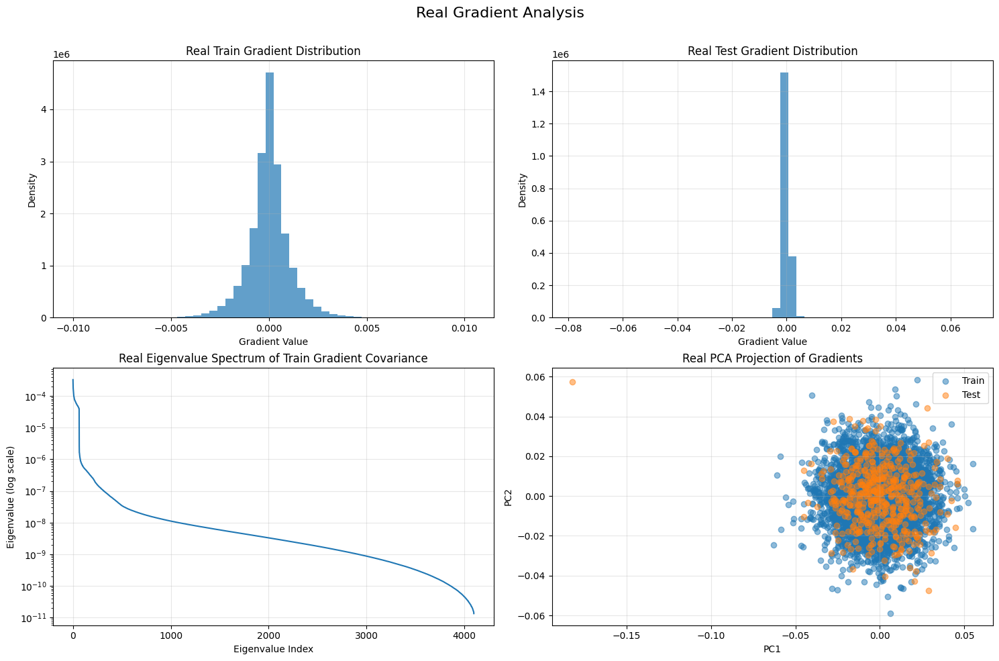

In [14]:
print(syn_train_grad.shape)
print(syn_test_grad.shape)
# Analyze synthetic gradients
analyze_gradients(syn_train_grad, syn_test_grad, "Synthetic")

# Analyze real gradients
for layer in range(real_train_grad.shape[0]):
    real_train_grad_layer = real_train_grad[layer]
    real_test_grad_layer = real_test_grad[layer]

    print(real_train_grad_layer.shape)
    print(real_test_grad_layer.shape)

    # Analyze gradients for each layer
    print(f"Analyzing gradients for layer {layer}...")
    analyze_gradients(real_train_grad_layer, real_test_grad_layer, "Real")